### LSE Data Analytics Online Career Accelerator 

# DA301:  Advanced Analytics for Organisational Impact

## Assignment template

## 1. Load and explore the data

In [2]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm 
from statsmodels.formula.api import ols

In [3]:
import statsmodels.api as sm
from sklearn import datasets 
import numpy as np
from sklearn import linear_model
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
import sklearn
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Note: Indicates situations that aren’t necessarily exceptions.
import warnings  
warnings.filterwarnings('ignore')  

In [4]:
# Any missing values?


In [ ]:
# Import all the necessary packages.
import pandas as pd
import numpy as np

# Load the CSV file(s) as reviews.
reviews = pd.read_csv('turtle_reviews.csv') 

# Print the DataFrame.
print(reviews.head())
print(reviews.info())


In [5]:
# Explore the data.

In [5]:
# Basic descriptive statistics.
# Determine the descriptive statistics.
reviews.head()
reviews.describe()


,age,renumeration,spending_score,loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


## 2. Drop columns

In [6]:
# Drop unnecessary columns.
# Drop unnecessary columns.
reviews = reviews.drop(columns=['product', 'review', 'summary', 'language'])

# View column names.
# Display a summary of the numeric variables and column names.

print(reviews.columns)
reviews.describe()

Index(['gender', 'age', 'renumeration', 'spending_score', 'loyalty_points',
       'education', 'platform'],
      dtype='object')


,age,renumeration,spending_score,loyalty_points
count,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000
std,13.573212,23.123984,26.094702,1283.239705
min,17.000000,12.300000,1.000000,25.000000
25%,29.000000,30.340000,32.000000,772.000000
50%,38.000000,47.150000,50.000000,1276.000000
75%,49.000000,63.960000,73.000000,1751.250000
max,72.000000,112.340000,99.000000,6847.000000


## 3. Rename columns

In [7]:
# Rename the columns.
reviews_new = reviews.rename(columns={'spending Score': 'SpendingScore',
                            'Loyalty Points': 'LoyaltyPoints'})

# View the reviews.
print(reviews.shape)
print(reviews.head())
reviews.info()
reviews.describe()

(2000, 7)
   gender  age  renumeration  spending_score  loyalty_points education  \
0    Male   18         12.30              39             210  graduate   
1    Male   23         12.30              81             524  graduate   
2  Female   22         13.12               6              40  graduate   
3  Female   25         13.12              77             562  graduate   
4  Female   33         13.94              40             366  graduate   

  platform  
0      Web  
1      Web  
2      Web  
3      Web  
4      Web  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   renumeration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 

,age,renumeration,spending_score,loyalty_points
count,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000
std,13.573212,23.123984,26.094702,1283.239705
min,17.000000,12.300000,1.000000,25.000000
25%,29.000000,30.340000,32.000000,772.000000
50%,38.000000,47.150000,50.000000,1276.000000
75%,49.000000,63.960000,73.000000,1751.250000
max,72.000000,112.340000,99.000000,6847.000000


In [8]:
# Drop duplicate values.
reviews_new.drop_duplicates(subset ='loyalty_points',
                       keep = False,
                       inplace = True)


# Drop duplicate columns.
reviews_final = reviews_new.drop(['renumeration', 'spending_score'],
                       axis=1)


# View the DataFrame.
print(reviews_final.shape)
print(reviews_final.head())
reviews_final.info()

(362, 5)
      gender  age  loyalty_points education platform
1400    Male   18             608  graduate      Web
1401    Male   23              25  graduate      Web
1403  Female   25             121  graduate      Web
1404  Female   33            1012  graduate      Web
1406  Female   37             873   diploma      Web
<class 'pandas.core.frame.DataFrame'>
Index: 362 entries, 1400 to 1998
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   gender          362 non-null    object
 1   age             362 non-null    int64 
 2   loyalty_points  362 non-null    int64 
 3   education       362 non-null    object
 4   platform        362 non-null    object
dtypes: int64(2), object(3)
memory usage: 17.0+ KB


In [9]:
# Remove unnecessary columns.
# Use dropped.drop to remove irrelevant columns from the DataFrame. 
# Specify that user_id and timestamp are columns (i.e. axis 1). 
reviews = reviews.drop(['platform'], axis=1)  

# Check the DataFrame.
reviews.head()

,gender,age,renumeration,spending_score,loyalty_points,education
0,Male,18,12.30,39,210,graduate
1,Male,23,12.30,81,524,graduate
2,Female,22,13.12,6,40,graduate
3,Female,25,13.12,77,562,graduate
4,Female,33,13.94,40,366,graduate


## 4. Save the DataFrame as a CSV file

In [12]:
# Create a CSV file as output.


In [10]:
# Install scipy.
!pip install scipy

# Import new CSV file with Pandas.
# Install the necessary module.
!pip install scipy



[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [11]:
# Check the metadata.
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   renumeration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
dtypes: float64(1), int64(3), object(2)
memory usage: 93.9+ KB


In [10]:
## How many missing values are there in weight column?
len(reviews[pd.isnull])

2000

In [12]:
# View the DataFrame.
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   renumeration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
dtypes: float64(1), int64(3), object(2)
memory usage: 93.9+ KB


## 5. Linear regression

### 5a) spending vs loyalty

In [13]:
# Import new CSV file with Pandas.
# Install the necessary module.
!pip install scipy

# Import the necessary libraries, packages, and modules.
# Data analysis:
import numpy as np  
import pandas as pd 

# Linear regression:
import sklearn
import statsmodels.api as sm 

# Visualisation:
import matplotlib.pyplot as plt 
import seaborn as sns


# Import the salary_data.csv file.
data = pd.read_csv('turtle_reviews.csv') 

# Print the DataFrame.
print(data.head())
print(data.info())
data.describe() 



[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
   gender  age  renumeration  spending_score  loyalty_points education  \
0    Male   18         12.30              39             210  graduate   
1    Male   23         12.30              81             524  graduate   
2  Female   22         13.12               6              40  graduate   
3  Female   25         13.12              77             562  graduate   
4  Female   33         13.94              40             366  graduate   

  language platform  product  \
0       EN      Web      453   
1       EN      Web      466   
2       EN      Web      254   
3       EN      Web      263   
4       EN      Web      291   

                                              review  \
0  When it comes to a DM's screen, the space on t...   
1  An Open Letter to GaleForce9*:\n\nYour unpaint...   
2  Nice art, nice printing.  Why two panels are f...   
3  Amazing buy! Bought it a

,age,renumeration,spending_score,loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


In [14]:
# Define the dependent variable.
y = reviews['loyalty_points']  

# Define the independent variable.
X = reviews[['spending_score']] 

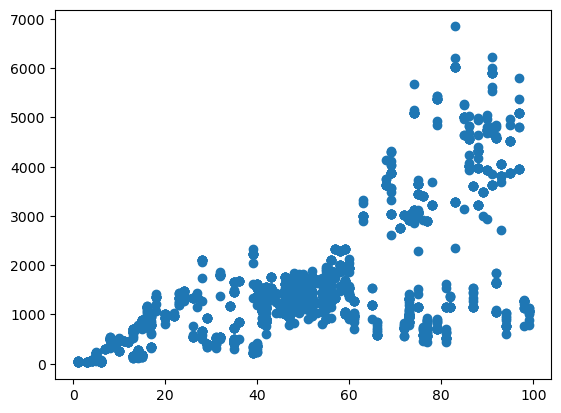

In [15]:
# Define independent variable.
y = reviews['loyalty_points'].values.reshape(-1, 1) 

# Define dependent variable.
x = reviews['spending_score'].values.reshape(-1, 1) 

# Check for homoscedasticity with Matplotlib.
plt.scatter(x, y)

# Create model and print summary of metrics.


In [16]:
# Create formula and pass through OLS methods.
f = 'y ~ x'
test = ols(f, data = reviews).fit()

# Print the regression table.
test.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.452
Model:                            OLS   Adj. R-squared:                  0.452
Method:                 Least Squares   F-statistic:                     1648.
Date:                Wed, 28 May 2025   Prob (F-statistic):          2.92e-263
Time:                        11:18:29   Log-Likelihood:                -16550.
No. Observations:                2000   AIC:                         3.310e+04
Df Residuals:                    1998   BIC:                         3.312e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -75.0527     45.931     -1.634      0.102    -165.129      15.024
x             33.0617      0.814     40.595      0.000      31.464      34.659
==============================================================================
Omnibus:                      126.554   Durbin-Watson:                   1.191
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              260.528
Skew:                           0.422   Prob(JB):                     2.67e-57
Kurtosis:                       4.554   Cond. No.                         122.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [17]:
# Extract the estimated parameters.
print("Parameters: ", test.params)  

# Extract the standard errors.
print("Standard errors: ", test.bse)  

# Extract the predicted values.
print("Predicted values: ", test.predict())  

Parameters:  Intercept   -75.052663
x            33.061693
dtype: float64
Standard errors:  Intercept    45.930554
x             0.814419
dtype: float64
Predicted values:  [1214.35337415 2602.94449102  123.31749662 ... 2933.56142361  453.93442921
  189.44088314]


In [18]:
# Set the X coefficient and the constant to generate the regression table.

# Create the linear regression model.
# Set the the coefficient to 1.0143 and the constant to -0.4618.
y_pred = 1736.517739 + (-4.012805) * reviews['loyalty_points']

# View the output.
y_pred

0         893.828689
1        -366.192081
2        1576.005539
3        -518.678671
4         267.831109
            ...     
1995   -14439.099216
1996     -426.384156
1997   -20791.369531
1998    -2468.901901
1999     -185.615856
Name: loyalty_points, Length: 2000, dtype: float64

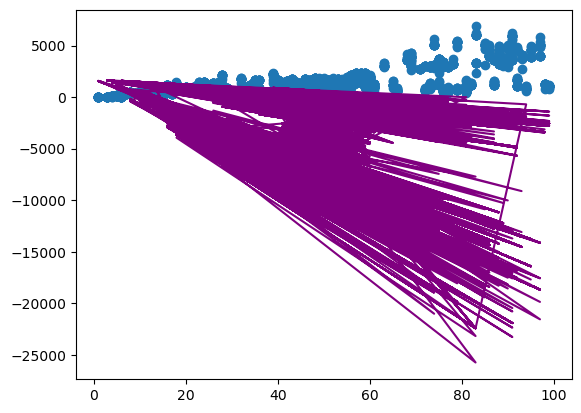

In [19]:
# Plot the graph with a regression line.
# Plot the data points.
plt.scatter(X, y)

# Plot the line.
plt.plot(X, y_pred, color='purple')

### 5b) renumeration vs loyalty

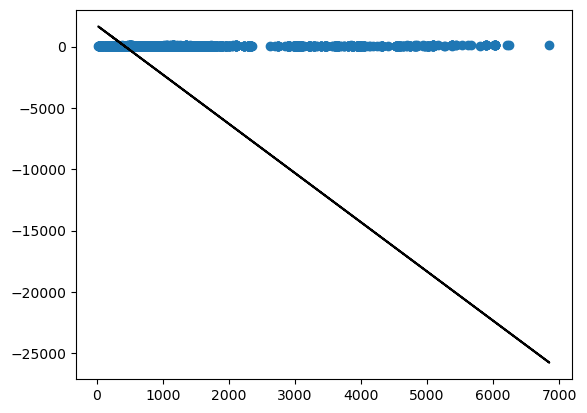

In [20]:
# Define dependant variable.
y = reviews['renumeration'].values.reshape(-1, 1) 

# Define independant variable.
x = reviews['loyalty_points'].values.reshape(-1, 1) 

# Check for homoscedasticity with Matplotlib.
plt.scatter(x, y)

# Create model and print summary of metrics.
# Plot the regression line (in black).
plt.plot(x, y_pred, color='black')


In [22]:
# Create formula and pass through OLS methods.
f = 'y ~ x'
test = ols(f, data = reviews).fit()

# Print the regression table.
test.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.380
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                     1222.
Date:                Wed, 28 May 2025   Prob (F-statistic):          2.43e-209
Time:                        11:18:56   Log-Likelihood:                -8641.8
No. Observations:                2000   AIC:                         1.729e+04
Df Residuals:                    1998   BIC:                         1.730e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     30.5606      0.646     47.321      0.000      29.294      31.827
x              0.0111      0.000     34.960      0.000       0.010       0.012
==============================================================================
Omnibus:                      382.801   Durbin-Watson:                   1.461
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              657.257
Skew:                           1.230   Prob(JB):                    1.90e-143
Kurtosis:                       4.357   Cond. No.                     3.22e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.22e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [23]:
# Extract the estimated parameters.
print("Parameters: ", test.params)  

# Extract the standard errors.
print("Standard errors: ", test.bse)  

# Extract the predicted values.
print("Predicted values: ", test.predict())  

Parameters:  Intercept    30.560555
x             0.011101
dtype: float64
Standard errors:  Intercept    0.645817
x            0.000318
dtype: float64
Predicted values:  [32.89186761 36.3777352  31.00461446 ... 92.88431491 42.19491551
 35.87816819]


In [24]:
# Set the X coefficient and the constant to generate the regression table.

# Create the linear regression model.
# Set the the coefficient to 1.0143 and the constant to -0.4618.
y_pred = 40.203457 + (-0.000449) * reviews['renumeration']

# View the output.
y_pred

0       40.197934
1       40.197934
2       40.197566
3       40.197566
4       40.197198
          ...    
1995    40.165534
1996    40.161853
1997    40.161853
1998    40.159275
1999    40.161853
Name: renumeration, Length: 2000, dtype: float64

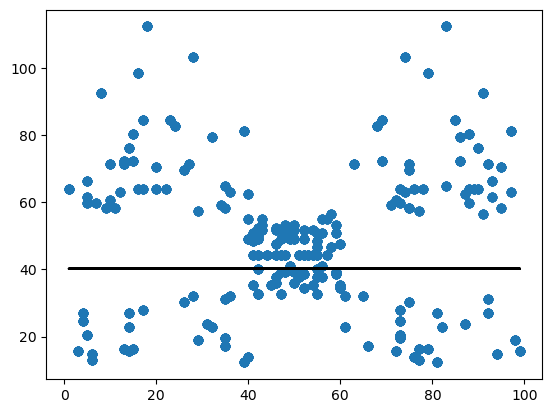

In [25]:
# Plot graph with regression line.
# Plot the data points.
plt.scatter(X, y)

# Plot the line.
plt.plot(X, y_pred, color='black')

### 5c) age vs loyalty

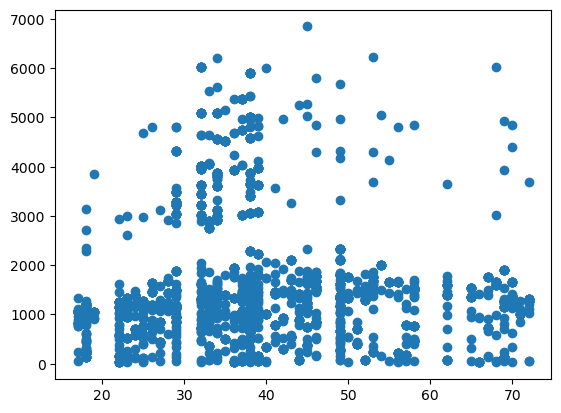

In [28]:
# Define independent variable.
y = reviews['loyalty_points'].values.reshape(-1, 1) 

# Define dependent variable.
x = reviews['age'].values.reshape(-1, 1) 

# Check for homoscedasticity with Matplotlib.
plt.scatter(x, y)

# Create model and print summary of metrics.


In [29]:
# Create formula and pass through OLS methods.
f = 'y ~ x'
test = ols(f, data = reviews).fit()

# Print the regression table.
test.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     3.606
Date:                Wed, 28 May 2025   Prob (F-statistic):             0.0577
Time:                        11:19:45   Log-Likelihood:                -17150.
No. Observations:                2000   AIC:                         3.430e+04
Df Residuals:                    1998   BIC:                         3.431e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1736.5177     88.249     19.678      0.000    1563.449    1909.587
x             -4.0128      2.113     -1.899      0.058      -8.157       0.131
==============================================================================
Omnibus:                      481.477   Durbin-Watson:                   2.277
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              937.734
Skew:                           1.449   Prob(JB):                    2.36e-204
Kurtosis:                       4.688   Cond. No.                         129.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [30]:
# Extract the estimated parameters.
print("Parameters: ", test.params)  

# Extract the standard errors.
print("Standard errors: ", test.bse)  

# Extract the predicted values.
print("Predicted values: ", test.predict())  


Parameters:  Intercept    1736.517739
x              -4.012805
dtype: float64
Standard errors:  Intercept    88.248731
x             2.113177
dtype: float64
Predicted values:  [1664.2872467  1644.22322095 1648.2360261  ... 1600.0823643  1600.0823643
 1608.1079746 ]


In [31]:
# Set the X coefficient and the constant to generate the regression table.
# Create the linear regression model.
y_pred = 40.203457 + (-0.000449) * reviews['age']

# View the output.
y_pred

0       40.195375
1       40.193130
2       40.193579
3       40.192232
4       40.188640
          ...    
1995    40.186844
1996    40.184150
1997    40.188191
1998    40.188191
1999    40.189089
Name: age, Length: 2000, dtype: float64

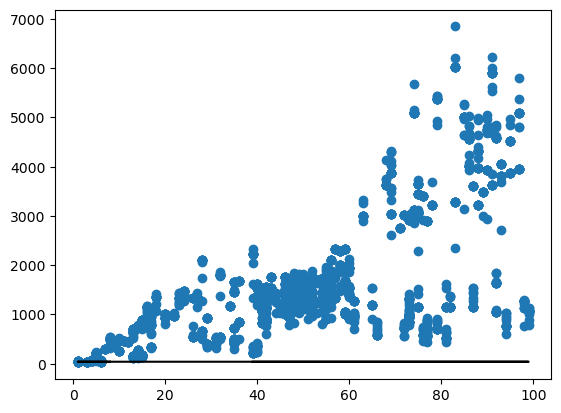

In [32]:
# Plot the data points with a scatterplot.
# Plot the data points.
plt.scatter(X, y)

# Plot the line.
plt.plot(X, y_pred, color='black')

In [33]:
# Import all the necessary packages:


# Set the variables: Use the diagnosis as the target variable and the remainder as input variables
X = reviews.drop('age', axis = 1)
y = reviews['loyalty_points']

In [34]:
# Define the dependent variable.
y = reviews['loyalty_points']  

# Define the independent variable.
X = reviews[['renumeration', 'spending_score']] 

In [35]:
# Fit the regression model.
mlr = linear_model.LinearRegression()
mlr.fit(X, y) 

LinearRegression()

In [36]:
# Call the predictions for X (array).
mlr.predict(X) 

array([ 4.57831319e-01,  1.38195101e+03, -1.05713790e+03, ...,
        4.44147048e+03,  2.16956070e+03,  1.71137682e+03])

In [37]:
# Print the R-squared value.
print("R-squared: ", mlr.score(X,y))  

# Print the intercept.
print("Intercept: ", mlr.intercept_) 

# Print the coefficients.
print("Coefficients:")  

# Map a similar index of multiple containers (to be used as a single entity).
list(zip(X, mlr.coef_))  

R-squared:  0.826913470198926
Intercept:  -1700.305097014438
Coefficients:


[('renumeration', 33.97949882180283), ('spending_score', 32.892694687821006)]

In [38]:
# Create a variable 'New_LoyatlyPoints' and define it as 5.7.
New_LoyatlyPoints = 5.75

# Create 'New_Renumeration' and define it as 15.2.
New_Renumeration = 15.2  

# Print the predicted value. 
print ("Predicted Value: \n", mlr.predict([[New_LoyatlyPoints ,New_Renumeration]]))  

Predicted Value: 
 [-1004.95401953]


In [102]:
# Observations:
# Using linear regression, I wanted to understand the relationship between loyalty points, age renumeration and spending scores. What was important was to understand the terminology. 
# Thus, I needed to understand what renumeration was (which meant total income per customer per year).  
# By understanding how important loyalty points interacted with spending scores, age, and renumeration through scatter plot, 
# made it clear to me that the variables with the strongest relationship is loyalty points as the dependant variables and spending scores and renumeration as the independent variable. 
# I used regression analysis because it’s the start in terms of prediction to understand patterns and the formulas that gives more information on ones result. 
# I ended up doing OLS just to have more of a clear model of the variables in their communication with the linear regression model.


In [ ]:
# Module 2


## 1. Load and prepare the data

In [39]:
pip install --upgrade scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 4.7 MB/s eta 0:00:00a 0:00:01m
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.6.0
    Uninstalling scikit-learn-1.6.0:
      Successfully uninstalled scikit-learn-1.6.0

[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [40]:
conda update -c conda-forge scikit-learn

Retrieving notices: done
Channels:
 - conda-forge
 - defaults
Platform: osx-64
Solving environment: done

## Package Plan ##

  environment location: /opt/anaconda3

  added / updated specs:
    - scikit-learn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2025.4.26  |       hbd8a1cb_0         149 KB  conda-forge
    certifi-2025.4.26          |     pyhd8ed1ab_0         154 KB  conda-forge
    conda-24.11.3              |  py312hb401068_0         1.1 MB  conda-forge
    openssl-3.5.0              |       hc426f3f_1         2.6 MB  conda-forge
    scikit-learn-1.6.1         |  py312he1a5313_0         9.3 MB  conda-forge
    ------------------------------------------------------------
                                           Total:        13.3 MB

The following packages will be UPDATED:

  ca-certificates    pkgs/main/osx-64::ca-certificates-202~ --> conda-forge/noarch

In [41]:
# Handles unbalanced data (scikit-learn needed)
!pip install imblearn  

# Optimised linear, algebra, integrations (scientific)
!pip install scipy  

# Simple tools for predictive data analytics
!pip install scikit-learn  

# Oversampling technique; creates new samples from data
!pip install SMOTE 


[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [118]:
# Import all the necessary packages.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import classification_report
import statsmodels.api as sm 
from sklearn.model_selection import train_test_split 

# Settings for the notebook.
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = [15, 10]

reviews2 = pd.read_csv('turtle_reviews.csv') 

# Sense-check the data.
print(reviews2.info())
reviews2.head()

FileNotFoundError: [Errno 2] No such file or directory: 'turtle_reviews.csv'

In [51]:
# Import the necessary package to create the confusion matrix. 
from sklearn.metrics import confusion_matrix  

In [44]:
# Import all the necessary packages
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeRegressor, plot_tree 
from sklearn.metrics import accuracy_score, confusion_matrix, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import warnings
import matplotlib.pyplot as plt

# Settings for the notebook.
warnings.filterwarnings("ignore")
plt.rcParams['figure.figsize'] = [15, 10]

In [45]:
import statsmodels.api as sm
from sklearn import datasets 
import numpy as np
from sklearn import linear_model
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
import sklearn
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Note: Indicates situations that aren’t necessarily exceptions.
import warnings  
warnings.filterwarnings('ignore')  

In [46]:
# Review the head of the data.
reviews2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   renumeration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   language        2000 non-null   object 
 7   platform        2000 non-null   object 
 8   product         2000 non-null   int64  
 9   review          2000 non-null   object 
 10  summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB


In [47]:
# Determine the descriptive statistics.
reviews2.describe()

,age,renumeration,spending_score,loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


In [48]:
# Determine the number of null values.
reviews2.isnull().sum()

gender            0
age               0
renumeration      0
spending_score    0
loyalty_points    0
education         0
language          0
platform          0
product           0
review            0
summary           0
dtype: int64

In [49]:
# Determine if data set is balanced.
reviews2['loyalty_points'].value_counts()

loyalty_points
1376    16
1014    16
772     15
1152    15
1338    15
        ..
1914     1
1315     1
1866     1
1282     1
1048     1
Name: count, Length: 627, dtype: int64

In [52]:
# Determine if data set is balanced.
reviews2['spending_score'].value_counts()

spending_score
42    76
55    73
73    64
46    57
35    51
      ..
7      7
34     7
9      7
11     7
71     7
Name: count, Length: 84, dtype: int64

In [53]:
# Import all the necessary packages:

# Specify Y.
y = reviews['loyalty_points'].values.reshape(-1, 1) 

# Specify X.
x = reviews['spending_score'].values.reshape(-1, 1) 


In [54]:
# Determine if data set is balanced.
reviews2['renumeration'].value_counts()

renumeration
44.28    134
63.96     96
39.36     63
49.20     62
71.34     59
        ... 
61.50     14
57.40     14
59.04     14
60.68     14
56.58     14
Name: count, Length: 64, dtype: int64

In [56]:
# Determine if data set is balanced.
reviews2['age'].value_counts()

age
38    180
49    120
34    110
29    110
32    110
37     90
39     80
18     80
33     80
45     60
25     60
36     50
23     50
22     50
46     50
69     40
58     40
53     40
26     40
70     30
41     30
35     30
17     30
62     30
43     30
44     30
27     30
24     30
52     20
40     20
28     20
68     20
57     20
51     20
42     20
65     20
72     20
50     20
67     20
56     20
19     10
54     10
66     10
71     10
55     10
Name: count, dtype: int64

In [57]:
# View DataFrame.
reviews2.head()

,gender,age,renumeration,spending_score,loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap


In [58]:
# Determine the number of null values.
reviews2.isnull().sum()

gender            0
age               0
renumeration      0
spending_score    0
loyalty_points    0
education         0
language          0
platform          0
product           0
review            0
summary           0
dtype: int64

In [59]:
# Drop unnecessary columns.
reviews2 = reviews2.drop(columns=['platform', 'language'])

# View column names.
# Display a summary of the numeric variables and column names.

print(reviews2.columns)
reviews2.describe()

Index(['gender', 'age', 'renumeration', 'spending_score', 'loyalty_points',
       'education', 'product', 'review', 'summary'],
      dtype='object')


,age,renumeration,spending_score,loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


In [60]:
# Import all the necessary packages:

# Set the variables: Use the diagnosis as the target variable and the remainder as input variables
X = reviews2.drop('renumeration', axis = 1)
y = reviews2['renumeration']


In [61]:
# Define the dependent variable.
y = reviews2['loyalty_points']  

# Define the independent variable.
X = reviews2[['renumeration']] 

In [62]:
# View the DataFrame.
reviews2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   renumeration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   product         2000 non-null   int64  
 7   review          2000 non-null   object 
 8   summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 140.8+ KB


## 2. Create train and test data sets.

In [ ]:
# Split the data into test and train data.


In [63]:
# Fit the regression model.
mlr = linear_model.LinearRegression()
mlr.fit(X, y) 

LinearRegression()

In [65]:
# Call the predictions for X (array).
mlr.predict(X) 

array([ 354.82374068,  354.82374068,  382.85775758, ..., 3102.15739671,
       3298.39551499, 3102.15739671])

In [66]:
# Print the R-squared value.
print("R-squared: ", mlr.score(X,y))  

# Print the intercept.
print("Intercept: ", mlr.intercept_) 

# Print the coefficients.
print("Coefficients:")  

# Map a similar index of multiple containers (to be used as a single entity).
list(zip(X, mlr.coef_))  

R-squared:  0.3795357732793634
Intercept:  -65.68651279500409
Coefficients:


[('renumeration', 34.187825485668895)]

In [67]:
# Create 'New_Renumeration' and define it as 15.2.
New_Renumeration = 15.2  

# Print the predicted value. 
print ("Predicted Value: \n", mlr.predict([[New_Renumeration]]))  

Predicted Value: 
 [453.96843459]


In [68]:
# Split the data in 'train' (80%) and 'test' (20%) sets.
X_train, X_test, Y_train, Y_test = sklearn.model_selection.train_test_split(X, y,
                                                                            test_size = 0.20,
                                                                            random_state = 5)


In [69]:
# Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
model = sm.OLS(Y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector.
Y_pred = model.predict(sm.add_constant(X_test)) 

# Call a summary of the model.
print_model = model.summary()

# Print the summary.
print(print_model)  

                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.354
Model:                            OLS   Adj. R-squared:                  0.353
Method:                 Least Squares   F-statistic:                     874.6
Date:                Wed, 28 May 2025   Prob (F-statistic):          1.12e-153
Time:                        11:36:48   Log-Likelihood:                -13320.
No. Observations:                1600   AIC:                         2.664e+04
Df Residuals:                    1598   BIC:                         2.665e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            3.8268     58.136      0.066   

In [70]:
# Call the predictions for X in the test set.
y_pred_mlr = mlr.predict(X_test)  

# Print the predictions.
print("Prediction for test set: {}".format(y_pred_mlr))  # Print the R-squared value.
print(mlr.score(X_test, Y_test)*100)  


Prediction for test set: [1111.74219693 1924.72868698 1532.25245041 1616.3545011   523.02784207
 1279.94629832 2821.81722772  523.02784207 2064.89877147  859.43604485
  887.47006175 2120.96680527  719.26596036 1279.94629832 1279.94629832
 1223.87826452  747.29997725 1616.3545011  2373.27295735  859.43604485
 1616.3545011   466.95980827  494.99382517  494.99382517 3102.15739671
 2401.30697425 2120.96680527 1279.94629832  466.95980827 1728.49056869
 1728.49056869 3298.39551499 2345.23894045 2681.64714323 1448.15039971
 1812.59261939  579.09587586 2205.06885596  579.09587586 2092.93278837
 1756.52458559 1055.67416313 1307.98031522 1616.3545011   635.16390966
 1448.15039971 1055.67416313 1756.52458559  382.85775758 1700.45655179
  775.33399415  466.95980827 2120.96680527 2092.93278837  354.82374068
 1448.15039971 1560.2864673  2401.30697425 1924.72868698 2821.81722772
 2653.61312634 1336.01433212  719.26596036 1223.87826452 1307.98031522
 1616.3545011  2653.61312634 2120.96680527 1924.7286

In [71]:
# Print the R-squared value.
print(mlr.score(X_test, Y_test)*100)  

45.82204763252646


In [72]:
# Add a constant.
x_temp = sm.add_constant(X_train)  

# Create an empty DataFrame. 
vif = pd.DataFrame() 

# Calculate the 'vif' for each value.
vif["VIF Factor"] = [variance_inflation_factor(x_temp.values, 
                                               i) for i in range(x_temp.values.shape[1])]  


# Create the feature columns.
vif['features'] = x_temp.columns  

# Print the values to two decimal points.
print(vif.round(2))  

   VIF Factor      features
0        5.42         const
1        1.00  renumeration


In [73]:
# Call the ‘metrics.mean_absolute_error’ function.  
print('Mean Absolute Error (Final):', metrics.mean_absolute_error(Y_test, Y_pred))  

# Call the ‘metrics.mean_squared_error’ function.
print('Mean Square Error (Final):', metrics.mean_squared_error(Y_test, Y_pred))  

Mean Absolute Error (Final): 766.7703496760552
Mean Square Error (Final): 1132180.2765428533


## 3. Create Decision tree regressor

In [21]:
# Create testing data
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=0,test_size=0.3)

# Create classifier
clf=DecisionTreeClassifier(random_state=0)

# Fit the training data
clf.fit(X_train,y_train)

NameError: name 'X' is not defined

In [ ]:
# Create your decision tree regressor.

In [75]:
# Predict using the training data
y_train_predicted=clf.predict(X_train)

# Predict using the test data
y_test_predicted=clf.predict(X_test)

# Print accuracy values
print(accuracy_score(y_train,y_train_predicted)) # prediction is the same as the observation
print(accuracy_score(y_test,y_test_predicted)) # prediction on 'unseen data'

0.2714285714285714
0.14833333333333334


In [ ]:
# Evaluate the model.


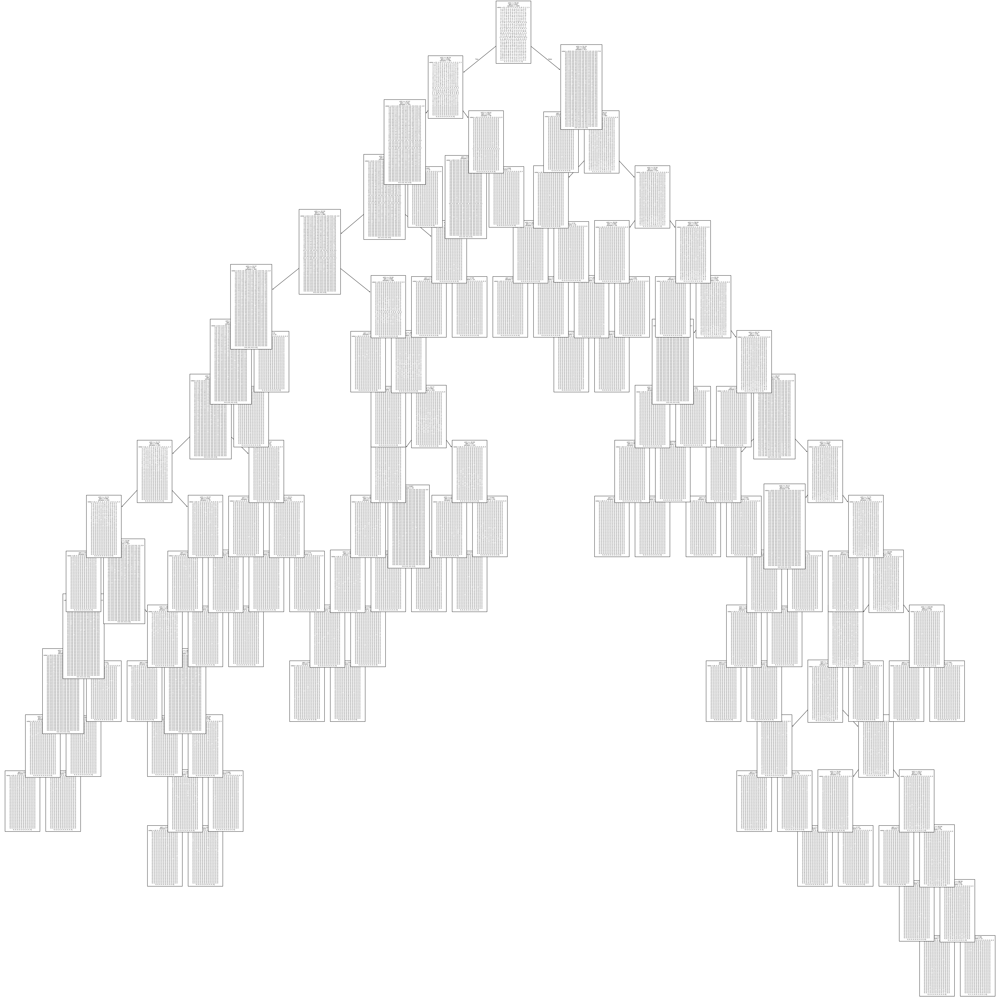

In [76]:
# Plot the tree

# Plot the decision tree to create the visualisation:
fig, ax = plt.subplots(figsize=(60, 60))
tree.plot_tree(clf, fontsize=5)

# Print the plot with plt.show().
plt.show() 

In [53]:
# Pruning the model using (pre-)pruning using supplied parameters
# In practice we would use a specific method such as cost complexity pruning to evaluate alternatives.
clfp = DecisionTreeClassifier(criterion = 'gini',
                             max_depth = 5,
                             min_samples_leaf = 5,
                             min_samples_split = 5)
clfp.fit(X_train,y_train)
y_predicted=clfp.predict(X_test)
accuracy_score(y_test,y_predicted)

0.028333333333333332

In [ ]:
# Prune the model.


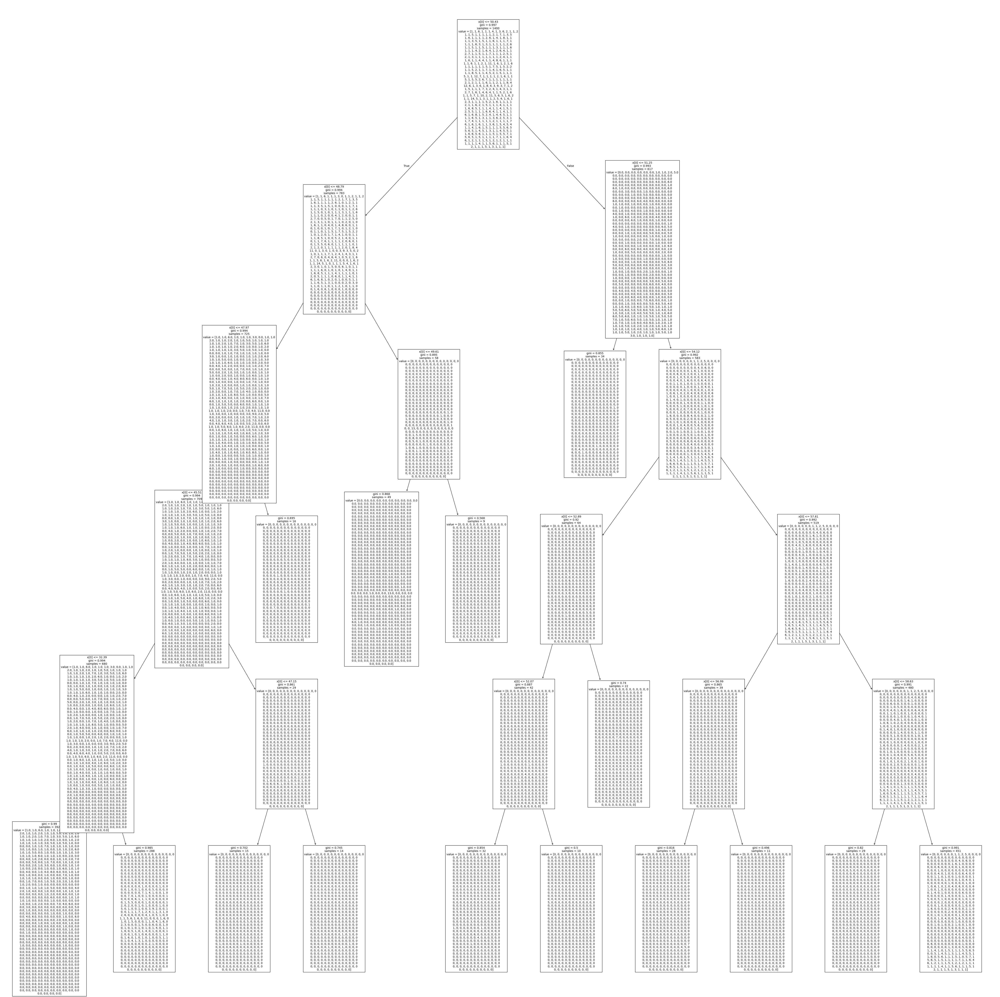

In [54]:
# Plot the pruned tree

# Plot the decision tree to create the visualisation:
fig, ax = plt.subplots(figsize=(65, 65))
tree.plot_tree(clfp, fontsize=10)

# Print the plot with plt.show().
plt.show() 

## 4. Fit and plot final model.

In [ ]:
# Fit and plot final model.


In [28]:
# Specify the DataFrame column and add/determine the values.
reviews2['Renumeration'].value_counts() 

Renumeration
44.28    134
63.96     96
39.36     63
49.20     62
71.34     59
        ... 
61.50     14
57.40     14
59.04     14
60.68     14
56.58     14
Name: count, Length: 64, dtype: int64

In [401]:
# Pruning the model using (pre-)pruning using supplied parameters
# In practice we would use a specific method such as cost complexity pruning to evaluate alternatives.
clfp = DecisionTreeClassifier(criterion = 'gini',
                             max_depth = 5,
                             min_samples_leaf = 5,
                             min_samples_split = 5)
clfp.fit(X_train,y_train)
y_predicted=clfp.predict(X_test)
accuracy_score(y_test,y_predicted)

0.028333333333333332

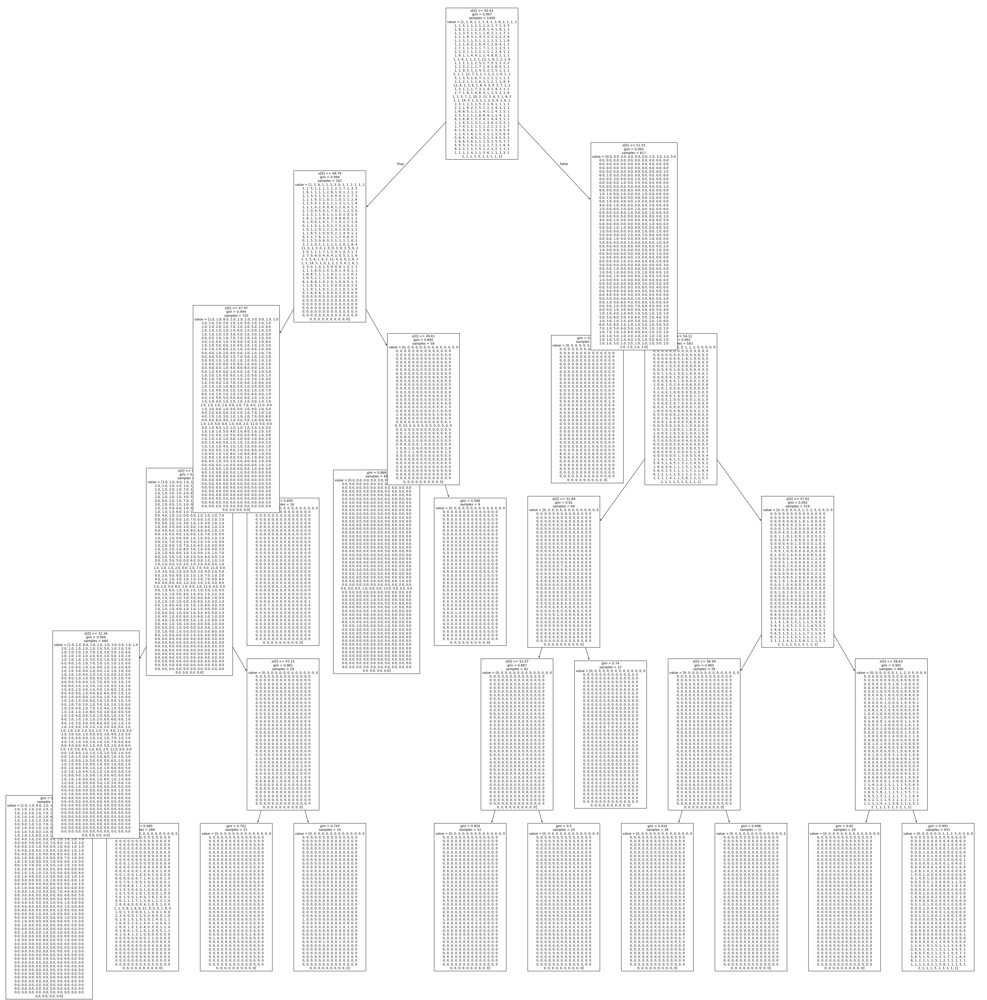

In [403]:
# Plot the pruned tree

# Plot the decision tree to create the visualisation:
fig, ax = plt.subplots(figsize=(55, 55))
tree.plot_tree(clfp, fontsize=10)

# Print the plot with plt.show().
plt.show() 

In [73]:
# Set a temporary DataFrame and add values.
df_vars = reviews2.columns.values.tolist()  

# Indicate what columns are kept.
to_keep = [i for i in df_vars if i not in cat_vars] 

# Define new DataFrame.
df_fin = reviews2[to_keep]  

# Print the column.
df_fin.columns.values 

array(['gender', 'age', 'education', ..., 'renumeration_98.4',
       'renumeration_103.32', 'renumeration_112.34'], dtype=object)

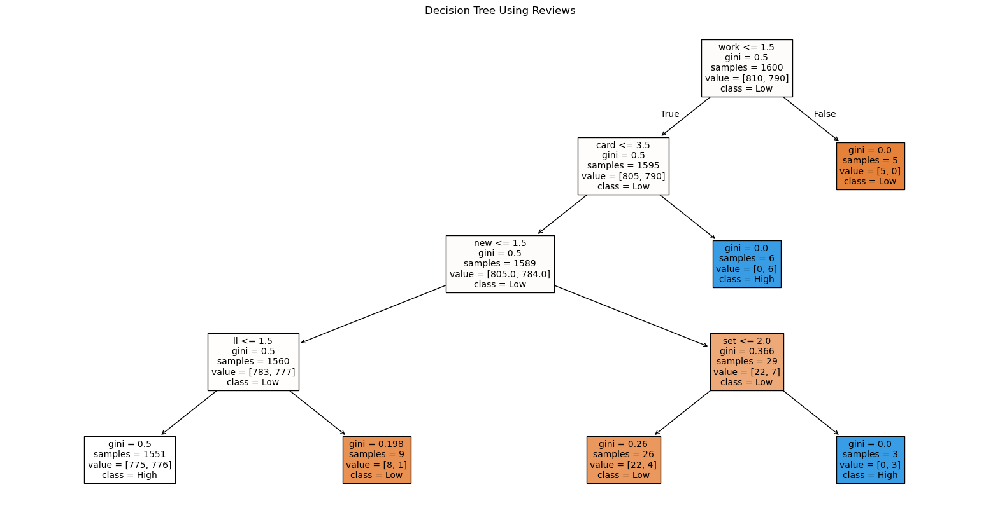

In [84]:
# Use the original 'review' text as input
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn import tree

# Create a simple binary target based on spending score (example)
reviews2['target'] = (reviews2['spending_score'] > reviews2['spending_score'].median()).astype(int)

# Vectorize the review text
vectorizer = CountVectorizer(stop_words='english', max_features=100)
X = vectorizer.fit_transform(reviews2['review'])
y = reviews2['target']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the decision tree
review_tree = DecisionTreeClassifier(max_depth=4, random_state=42)
review_tree.fit(X_train, y_train)

# Plot the tree
plt.figure(figsize=(20, 10))
tree.plot_tree(
    review_tree,
    filled=True,
    feature_names=vectorizer.get_feature_names_out(),
    class_names=["Low", "High"],
    fontsize=10
)
plt.title("Decision Tree Using Reviews")
plt.show()


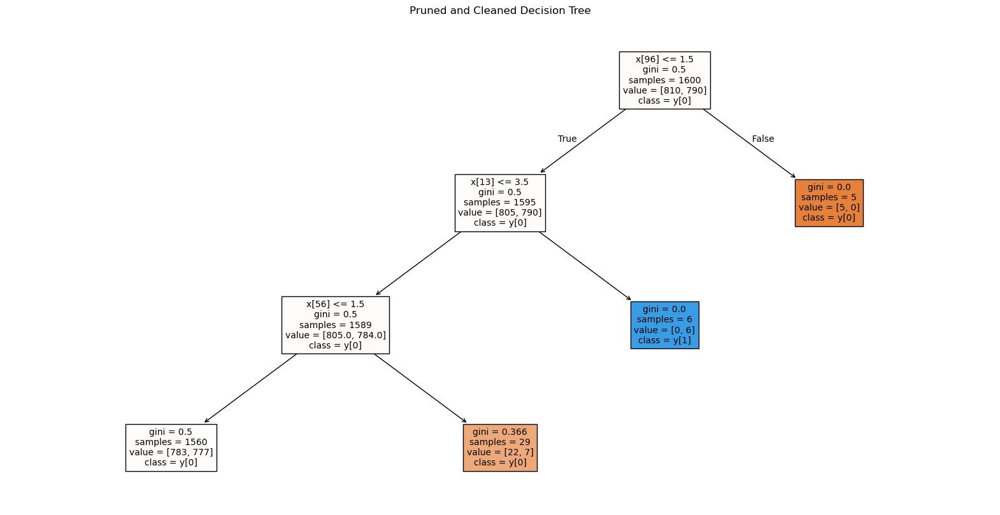

In [85]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import matplotlib.pyplot as plt

# Step 1: Train a simplified decision tree
clean_tree = DecisionTreeClassifier(
    max_depth=3,              # Optional: limit tree depth
    min_samples_split=5,      # Optional: prevent splitting small nodes
    min_samples_leaf=3,       # Optional: prevent tiny leaf nodes
    random_state=42
)
clean_tree.fit(X_train, y_train)

# Step 2: Plot the cleaned tree
fig, ax = plt.subplots(figsize=(20, 10))
tree.plot_tree(
    clean_tree,
    filled=True,
    feature_names=X_train.columns if hasattr(X_train, 'columns') else None,
    class_names=True,
    fontsize=10
)
plt.title("Pruned and Cleaned Decision Tree")
plt.show()


In [86]:
import pandas as pd

# Example DataFrame
df = pd.DataFrame({
    'color': ['Red', 'Blue', 'Green', 'Blue'],
    'size': ['S', 'M', 'L', 'XL'],
    'price': [10.99, 12.99, 9.99, 14.99]
})

# Create dummy variables for 'color' and 'size'
df_dummies = pd.get_dummies(df, columns=['color', 'size'], drop_first=True)

print(df_dummies)


   price  color_Green  color_Red  size_M  size_S  size_XL
0  10.99        False       True   False    True    False
1  12.99        False      False    True   False    False
2   9.99         True      False   False   False    False
3  14.99        False      False   False   False     True


In [89]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import matplotlib.pyplot as plt

# Prepare features (drop text columns) and target
reviews2 = reviews2.drop(columns=['review', 'summary'])
# For simplicity, let's define a dummy classification target: e.g., high vs. low spender
reviews2['target'] = (reviews2['spending_score'] > reviews2['spending_score'].median()).astype(int)
X = reviews2.drop(columns=['target'])
y = reviews2['target']

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a decision tree classifier
dtree = DecisionTreeClassifier(max_depth=4, random_state=42)
dtree.fit(X_train, y_train)

# Plot the tree
plt.figure(figsize=(20, 10))
tree.plot_tree(dtree, filled=True, feature_names=X.columns, class_names=["Low", "High"], fontsize=10)
plt.title("Decision Tree: Spending Score Classification")
plt.show()


ValueError: could not convert string to float: 'Female'

In [107]:
reviews2 = pd.read_csv("turtle_reviews.csv") 

# Prepare input and target
vectorizer = CountVectorizer(stop_words='english', max_features=100)
X_text = vectorizer.fit_transform(reviews2['review'])  # Text input
y = reviews2['loyalty_points']  # Numeric target

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X_text, y, test_size=0.2, random_state=42)

# Fit the model
tree_model = DecisionTreeRegressor(max_depth=4, random_state=42)
tree_model.fit(X_train, y_train)

# Visualize the tree
plt.figure(figsize=(20, 10))
plot_tree(
    tree_model,
    filled=True,
    feature_names=vectorizer.get_feature_names_out(),
    fontsize=8
)
plt.title("Decision Tree: Predicting Loyalty Points from Reviews")
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'turtle_reviews.csv'

In [104]:
print(reviews2.columns)

Index(['gender', 'age', 'renumeration', 'spending_score', 'loyalty_points',
       'education', 'product', 'target', 'loyalty_level'],
      dtype='object')


In [ ]:
### Observations
# : it was easier to run the regression line with an answer than it was for decision tree. I did not get a lot of information fter running the decision tree classifier, most likely because theyre was too much numeric data to report much accuracy as the other codes which where run. Pruning strateges where executed and did accomplish their goal, but this still was not the coding strategy if I was going to have as much variables and numeric data as was necessary. I think having a target to churn would have made it more concise to organise my data as well. I really tried to follow the decision tree but it was a no go zone,



## 1. Load and explore the data

In [87]:
### Week 3 assignment: Clustering with k-means using Python
# Import necessary libraries.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings('ignore')

In [88]:
# Load the CSV file(s) as df3.
df3 = pd.read_csv('turtle_reviews.csv') 

# Sense-check the data.
print(df3.info())
df3.head()

# View DataFrame.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   renumeration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   language        2000 non-null   object 
 7   platform        2000 non-null   object 
 8   product         2000 non-null   int64  
 9   review          2000 non-null   object 
 10  summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB
None


,gender,age,renumeration,spending_score,loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap


In [107]:
# Drop unnecessary columns.
df3 = df3.drop(columns=['review', 'summary', 'language'])

# View column names.
# Display a summary of the numeric variables and column names.
print(df3.columns)
df3.describe()

# View DataFrame.


Index(['gender', 'age', 'renumeration', 'spending_score', 'loyalty_points',
       'education', 'platform', 'product'],
      dtype='object')


,age,renumeration,spending_score,loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


In [ ]:
# Explore the data.


In [41]:
# Determine the number of null values.
df3.isnull().sum()

Gender            0
Age               0
Renumeration      0
Spending Score    0
Loyalty Points    0
Education         0
platform          0
dtype: int64

In [91]:
# Determine if data set is balanced.
df3['loyalty_points'].value_counts()

loyalty_points
1376    16
1014    16
772     15
1152    15
1338    15
        ..
1914     1
1315     1
1866     1
1282     1
1048     1
Name: count, Length: 627, dtype: int64

In [92]:
# Determine if data set is balanced.
df3['renumeration'].value_counts()

renumeration
44.28    134
63.96     96
39.36     63
49.20     62
71.34     59
        ... 
61.50     14
57.40     14
59.04     14
60.68     14
56.58     14
Name: count, Length: 64, dtype: int64

In [93]:
# Determine if data set is balanced.
df3['spending_score'].value_counts()

spending_score
42    76
55    73
73    64
46    57
35    51
      ..
7      7
34     7
9      7
11     7
71     7
Name: count, Length: 84, dtype: int64

In [130]:
# Descriptive statistics.
df3.describe()

,age,renumeration,spending_score,loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


## 2. Plot

<Axes: xlabel='spending_score', ylabel='loyalty_points'>

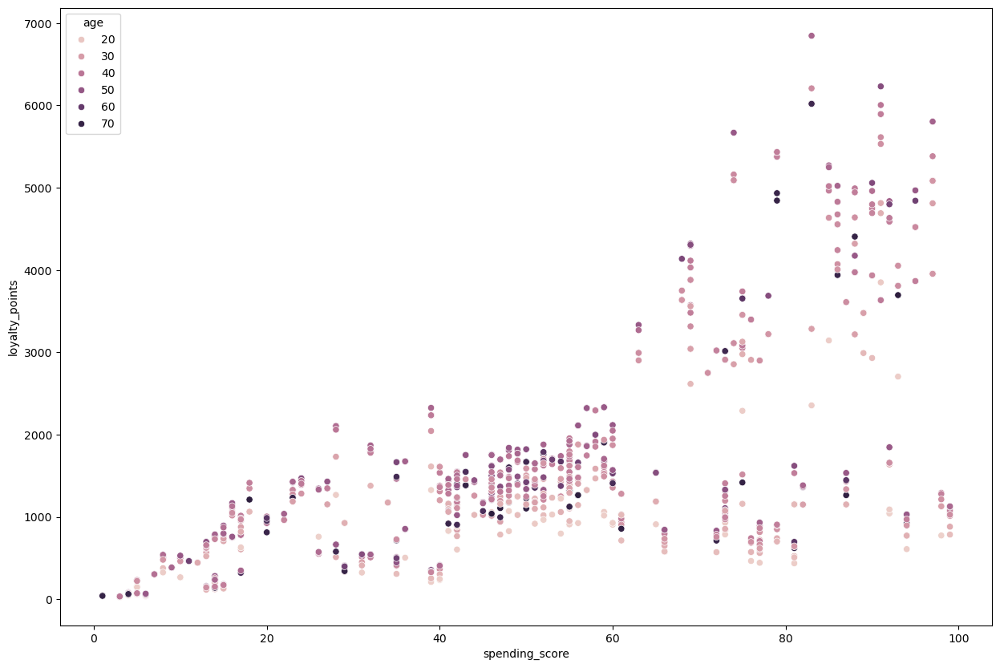

In [90]:
# Create a scatterplot with Seaborn.
# Import Seaborn and Matplotlib.
from matplotlib import pyplot as plt
import seaborn as sns

# Create a scatterplot with Seaborn.
sns.scatterplot(x='spending_score', 
                y='loyalty_points',
                data=df3,
                hue='age')

<Axes: xlabel='spending_score', ylabel='loyalty_points'>

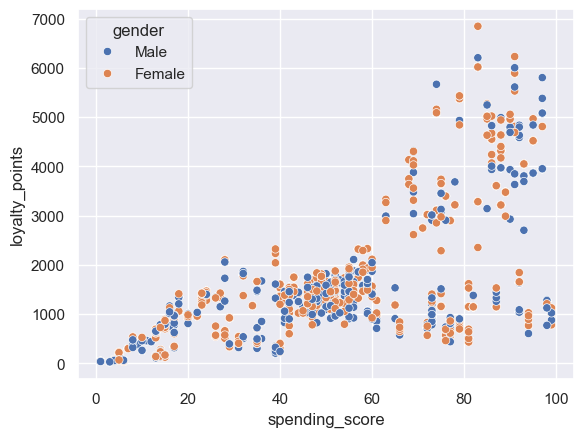

In [98]:
# Create a scatterplot with Seaborn.
# Import Seaborn and Matplotlib.
from matplotlib import pyplot as plt
import seaborn as sns

# Create a scatterplot with Seaborn.
sns.scatterplot(x='spending_score', 
                y='loyalty_points',
                data=df3,
                hue='gender')

<Axes: xlabel='renumeration', ylabel='loyalty_points'>

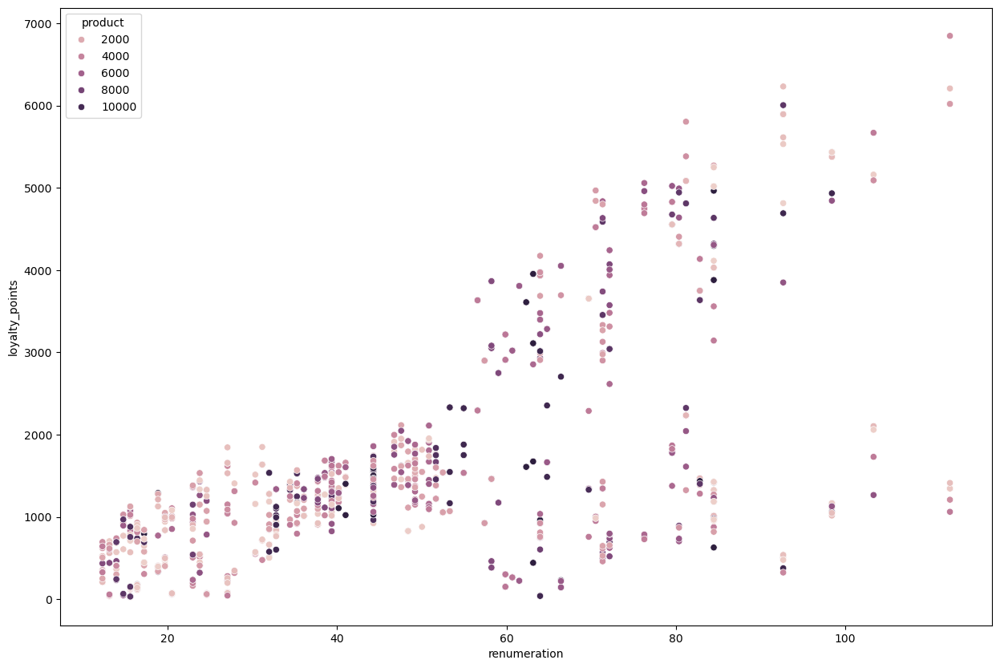

In [91]:
# Create a scatterplot with Seaborn.
# Import Seaborn and Matplotlib.
from matplotlib import pyplot as plt
import seaborn as sns

# Create a scatterplot with Seaborn.
sns.scatterplot(x='renumeration', 
                y='loyalty_points',
                data=df3,
                hue='product')

<Axes: xlabel='renumeration', ylabel='loyalty_points'>

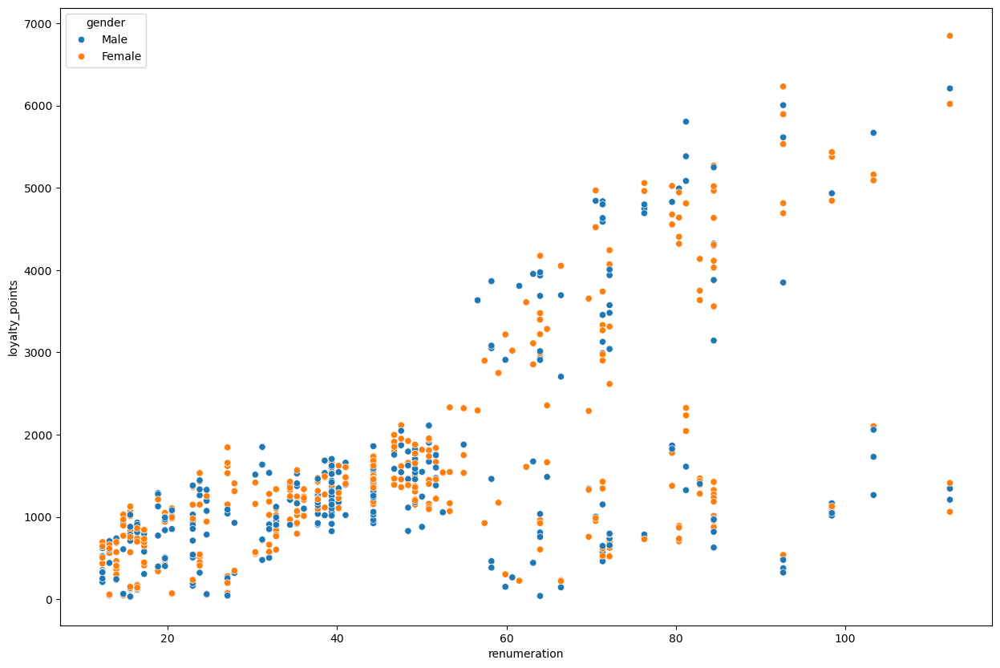

In [92]:
# Create a scatterplot with Seaborn.
# Import Seaborn and Matplotlib.
from matplotlib import pyplot as plt
import seaborn as sns

# Create a scatterplot with Seaborn.
sns.scatterplot(x='renumeration', 
                y='loyalty_points',
                data=df3,
                hue='gender')

<Axes: xlabel='renumeration', ylabel='loyalty_points'>

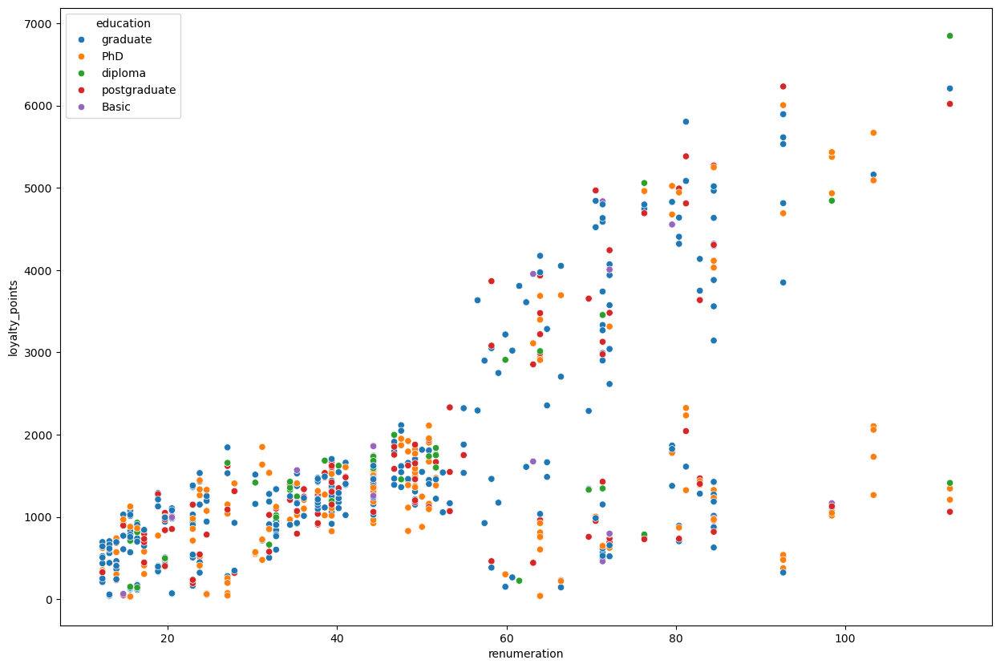

In [93]:
# Create a scatterplot with Seaborn.
# Import Seaborn and Matplotlib.
from matplotlib import pyplot as plt
import seaborn as sns

# Create a scatterplot with Seaborn.
sns.scatterplot(x='renumeration', 
                y='loyalty_points',
                data=df3,
                hue='education')

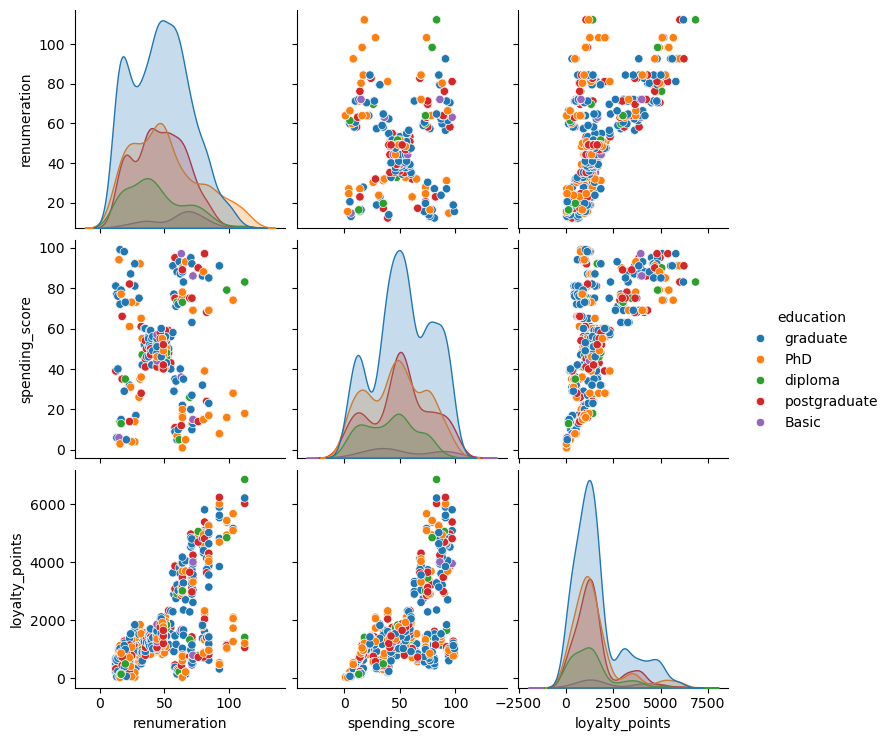

In [94]:
# Create a pairplot with Seaborn.
x = df3[['renumeration', 'spending_score', 'loyalty_points']]

sns.pairplot(df3,
             vars=x,
             hue='education',
             diag_kind='kde')

## 3. Elbow and silhoutte methods

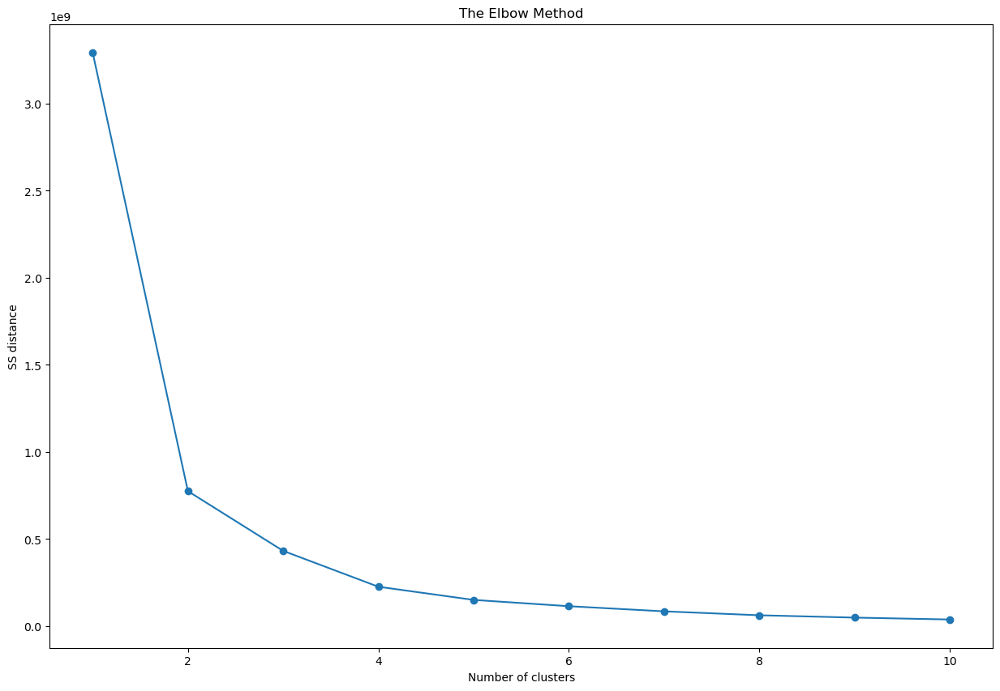

In [95]:
# Determine the number of clusters: Elbow method.

# Import the KMeans class.
from sklearn.cluster import KMeans 

# Elbow chart for us to decide on the number of optimal clusters.
ss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i,
                    init='k-means++',
                    max_iter=300,
                    n_init=10,
                    random_state=0)
    kmeans.fit(x)
    ss.append(kmeans.inertia_)

# Plot the elbow method.
plt.plot(range(1, 11),
         ss,
         marker='o')

# Insert labels and title.
plt.title("The Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("SS distance")

plt.show()

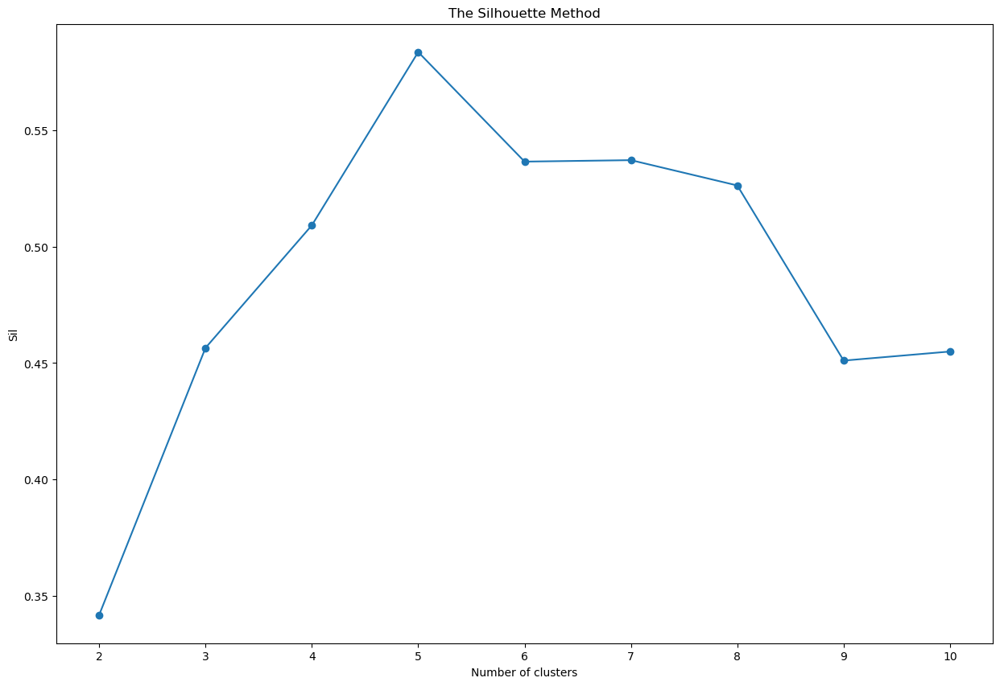

In [53]:
# Determine the number of clusters: Silhouette method.

# Import silhouette_score class from sklearn.
from sklearn.metrics import silhouette_score

# Find the range of clusters to be used using silhouette method.
sil = []
kmax = 10

for k in range(2, kmax+1):
    kmeans_s = KMeans(n_clusters=k).fit(x)
    labels = kmeans_s.labels_
    sil.append(silhouette_score(x,
                                labels,
                                metric='euclidean'))

# Plot the silhouette method.
plt.plot(range(2, kmax+1),
         sil,
         marker='o')

# Insert labels and title.
plt.title("The Silhouette Method")
plt.xlabel("Number of clusters")
plt.ylabel("Sil")

plt.show()

## 4. Evaluate k-means model at different values of *k*

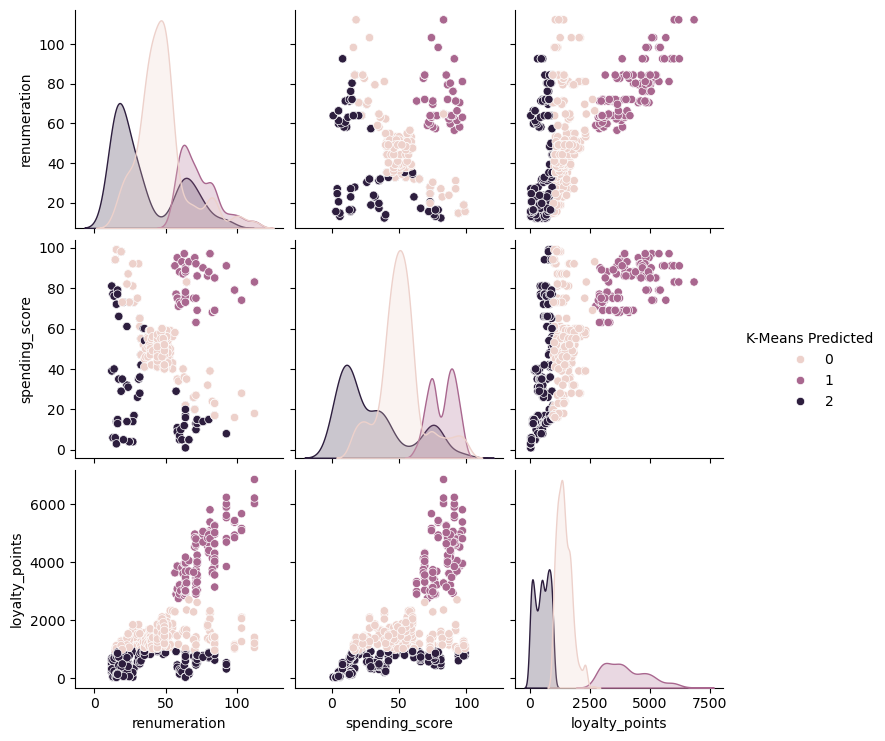

In [101]:
# Use three clusters.
kmeans = KMeans(n_clusters = 3, 
                max_iter = 15000,
                init='k-means++',
                random_state=0).fit(x)

clusters = kmeans.labels_

x['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(x,
             hue='K-Means Predicted',
             diag_kind= 'kde')

In [97]:
# Check the number of observations per predicted class.
x['K-Means Predicted'].value_counts()

K-Means Predicted
0    988
2    660
1    352
Name: count, dtype: int64

In [56]:
# Apply the final model.

In [98]:
# View the K-Means predicted.
print(x.head())

   renumeration  spending_score  loyalty_points  K-Means Predicted
0         12.30              39             210                  2
1         12.30              81             524                  2
2         13.12               6              40                  2
3         13.12              77             562                  2
4         13.94              40             366                  2


<Axes: xlabel='renumeration', ylabel='loyalty_points'>

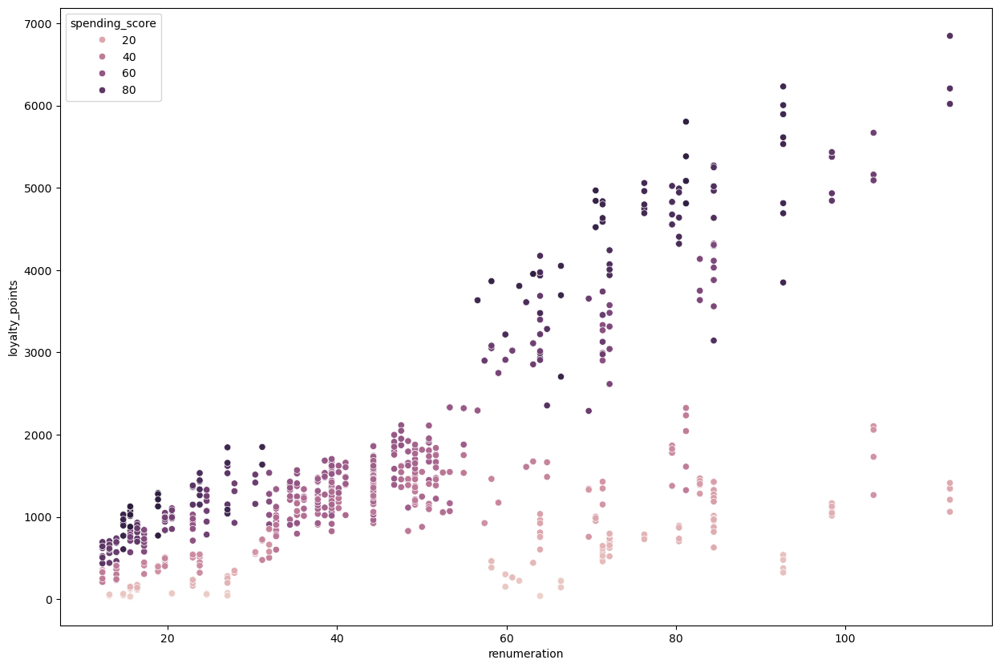

In [99]:
# Check the number of observations per predicted class.
# Create a scatterplot with Seaborn.
# Import Seaborn and Matplotlib.
from matplotlib import pyplot as plt
import seaborn as sns

# Create a scatterplot with Seaborn.
sns.scatterplot(x='renumeration', 
                y='loyalty_points',
                data=df3,
                hue='spending_score')

## 7. Discuss: Insights and observations

***Your observations here...***

In [ ]:
# To understand the relationship between the x variable loyalty points and the y variables, remuneration, spending scores, etc. 
# This allowed me to create then different graphs to compare variable interactions. 
# The goal was to see how the groups interact and their characteristics with specific groups. 
# Unsurprisingly, the highest purchasing group by gender is female and the highest in accumulating loyalty points. 
# Then, I checked the hue against the x and y variables to group and colour the data. 
# The education hue on these variables indicates that PhD and graduate customers are likelier to have higher remuneration and loyalty points. 
# These relationships were best demonstrated by pairplot and seaborn. Loyalty points are higher among people in their 20s and 30s, along with spending scores. 
# Remuneration has a higher relationship with graduate customers. 
# What is clear is that the primary demographics are to be targeted online because age is a factor in who will purchase these products, 
# which is lower than middle age and means they are on the right track to focus their platform online.

# 

In [ ]:
### Week 4 assignment: NLP using Python

## 1. Load and explore the data

In [11]:
# Import all the necessary packages.
import pandas as pd
import numpy as np
import nltk 
import os 
import matplotlib.pyplot as plt

# nltk.download ('punkt').
# nltk.download ('stopwords').

from wordcloud import WordCloud
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from textblob import TextBlob
from scipy.stats import norm

# Import Counter.
from collections import Counter

import warnings
warnings.filterwarnings('ignore')

In [12]:
# Load the data set as df4.
df4 = pd.read_csv('turtle_reviews.csv') 

# View DataFrame.
# Sense-check the data.
print(df4.info())
df4.head()
df4.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   renumeration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   language        2000 non-null   object 
 7   platform        2000 non-null   object 
 8   product         2000 non-null   int64  
 9   review          2000 non-null   object 
 10  summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB
None


,age,renumeration,spending_score,loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


In [5]:
# Explore data set.

In [13]:
# Import necessary libraries.
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# Import the data set.
df4 = pd.read_csv('turtle_reviews.csv')

# View the data.
df4.shape

(2000, 11)

In [42]:
# Keep necessary columns. Drop unnecessary columns.

# Drop unnecessary columns.
df4 = df4.drop(columns=['language'])

# View column names.
# Display a summary of the numeric variables and column names.

# View df4.
print(df4.columns)
df4.describe()


Index(['gender', 'age', 'renumeration', 'spending_score', 'loyalty_points',
       'education', 'review', 'summary'],
      dtype='object')


,age,renumeration,spending_score,loyalty_points
count,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000
std,13.573212,23.123984,26.094702,1283.239705
min,17.000000,12.300000,1.000000,25.000000
25%,29.000000,30.340000,32.000000,772.000000
50%,38.000000,47.150000,50.000000,1276.000000
75%,49.000000,63.960000,73.000000,1751.250000
max,72.000000,112.340000,99.000000,6847.000000


In [43]:
# Determine if there are any missing values.

# Determine the number of rows where the Summary and Review are not populated
df4['summary' and 'review'].isna().sum()

# Determine the number of rows where the Review are not populated
df4['summary' and 'review'].isna().sum()

0

In [44]:
# Drop the empty rows.
df4.dropna(subset=['summary' and 'review'], inplace=True)

# View the shape of the DataFrame.
df4.shape

(2000, 8)

In [45]:
# Check the number of duplicate values in the Review column.
df4.review.duplicated().sum()

20

In [46]:
# Check the number of duplicate values in the Summary column.
df4.summary.duplicated().sum()

568

## 2. Prepare the data for NLP
### 2a) Change to lower case and join the elements in each of the columns respectively (review and summary)

In [47]:
# Review: Change all to lowercase and join with a space.


# Transform data to lowercase.
df4['review'] = df4['review'].apply(lambda x: " ".join(x.lower() for x in x.split()))

# Preview the result.
df4['review'].head()

0    when it comes to a dm's screen, the space on t...
1    an open letter to galeforce9*: your unpainted ...
2    nice art, nice printing. why two panels are fi...
3    amazing buy! bought it as a gift for our new d...
4    as my review of gf9's previous screens these w...
Name: review, dtype: object

In [48]:
# Summary: Change all to lower case and join with a space.
# Transform data to lowercase.
df4['summary'] = df4['summary'].apply(lambda x: " ".join(x.lower() for x in x.split()))

# Preview the result.
df4['summary'].head()

0    the fact that 50% of this space is wasted on a...
1    another worthless dungeon master's screen from...
2                      pretty, but also pretty useless
3                                           five stars
4                                           money trap
Name: summary, dtype: object

### 2b) Replace punctuation in each of the columns respectively (review and summary)

In [49]:
# Replace all the punctuations in review column.
# Remove punctuation.
df4['review'] = df4['review'].str.replace('[^\w\s]','')

# Preview the result.
df4['review'].head()

0    when it comes to a dm's screen, the space on t...
1    an open letter to galeforce9*: your unpainted ...
2    nice art, nice printing. why two panels are fi...
3    amazing buy! bought it as a gift for our new d...
4    as my review of gf9's previous screens these w...
Name: review, dtype: object

In [50]:
# Replace all the puncuations in Summary column.
# Remove punctuation.
df4['summary'] = df4['summary'].str.replace('[^\w\s]','')

# Preview the result.
df4['summary'].head()


0    the fact that 50% of this space is wasted on a...
1    another worthless dungeon master's screen from...
2                      pretty, but also pretty useless
3                                           five stars
4                                           money trap
Name: summary, dtype: object

### 2c) Drop duplicates in both columns

In [35]:
# Check the number of duplicate values in the Review column.
df4.review.duplicated().sum()

32

In [36]:
# Check the number of duplicate values in the Summary column.
df4.summary.duplicated().sum()

598

In [51]:
# Drop duplicates in both columns.

# View DataFrame.
# Drop duplicates.
reviews = df4.drop_duplicates(subset=['review' and 'summary'])

# Preview data.
reviews.reset_index(inplace=True)
reviews.head()

,index,gender,age,renumeration,spending_score,loyalty_points,education,review,summary
0,0,Male,18,12.30,39,210,graduate,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...
1,1,Male,23,12.30,81,524,graduate,an open letter to galeforce9*: your unpainted ...,another worthless dungeon master's screen from...
2,2,Female,22,13.12,6,40,graduate,"nice art, nice printing. why two panels are fi...","pretty, but also pretty useless"
3,3,Female,25,13.12,77,562,graduate,amazing buy! bought it as a gift for our new d...,five stars
4,4,Female,33,13.94,40,366,graduate,as my review of gf9's previous screens these w...,money trap


## 3. Tokenise and create wordclouds

In [52]:
# Create new DataFrame (copy DataFrame).


# View DataFrame.
# View the shape of the data.
reviews.shape

(1402, 9)

In [53]:
# Apply tokenisation to both columns.
# Import nltk and download nltk's resources to assist with tokenisation.
import nltk

nltk.download('punkt')
from nltk.tokenize import word_tokenize

# View DataFrame.


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/a.afenyiviolino/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [54]:
# Tokenise the words.
reviews['tokens'] = reviews['summary'].apply(word_tokenize)

# Preview data.
reviews['tokens'].head()

0    [the, fact, that, 50, %, of, this, space, is, ...
1    [another, worthless, dungeon, master, 's, scre...
2              [pretty, ,, but, also, pretty, useless]
3                                        [five, stars]
4                                        [money, trap]
Name: tokens, dtype: object

In [55]:
# Tokenise the words.
reviews['tokens'] = reviews['summary'].apply(word_tokenize)

# Preview data.
reviews['tokens'].head()

0    [the, fact, that, 50, %, of, this, space, is, ...
1    [another, worthless, dungeon, master, 's, scre...
2              [pretty, ,, but, also, pretty, useless]
3                                        [five, stars]
4                                        [money, trap]
Name: tokens, dtype: object

In [56]:
# Define an empty list of tokens.
all_tokens = []

for i in range(reviews.shape[0]):
    # Add each token to the list.
    all_tokens = all_tokens + reviews['tokens'][i]

In [59]:
# Import the FreqDist class.
from nltk.probability import FreqDist

# Calculate the frequency distribution.
fdist = FreqDist(all_tokens)

# Preview data.

In [60]:
# String all the Review together in a single variable.
# Create an empty string variable.
all_review = ''
for i in range(reviews.shape[0]):
    # Add each review.
    all_review = all_review + reviews['review'][i]

In [61]:
# String all the Summary together in a single variable.
# Create an empty string variable.
all_summary = ''
for i in range(reviews.shape[0]):
    # Add each review.
    all_summary = all_summary + reviews['summary'][i]

In [62]:
# Import along with matplotlib and seaborn for visualisation.
from wordcloud import WordCloud 
import matplotlib.pyplot as plt 
import seaborn as sns

In [63]:
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
word_cloud = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(all_review) 

In [64]:
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
word_cloud = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(all_summary) 

In [ ]:
# Summary: Create a word cloud.


In [ ]:
# Summary: Plot the WordCloud image.


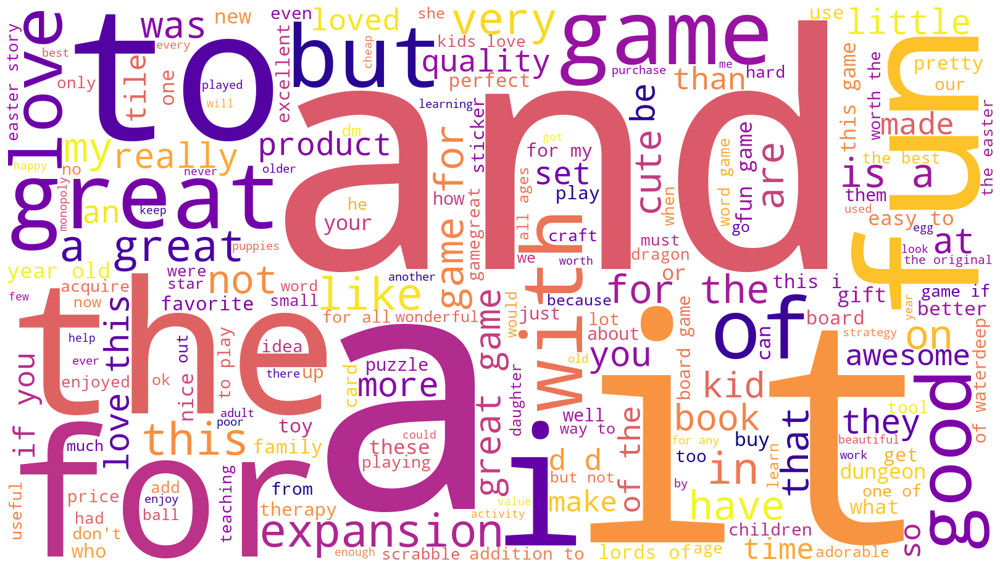

In [65]:
# Plot the WordCloud image.                    
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

# Note that your word cloud might differ slightly from the one provided.

## 4. Frequency distribution and polarity
### 4a) Create frequency distribution

### 4b) Remove alphanumeric characters and stopwords

In [66]:
# Delete all the alpanum.
# Filter out tokens that are neither alphabets nor numbers (to eliminate punctuation marks, etc.).
tokens = [word for word in all_tokens if word.isalnum()]

In [67]:
# Remove all the stopwords

# Download the stopword list.
nltk.download ('stopwords')
from nltk.corpus import stopwords

# Create a set of English stopwords.
english_stopwords = set(stopwords.words('english'))

# Create a filtered list of tokens without stopwords.
tokens2 = [x for x in tokens if x.lower() not in english_stopwords]

# Define an empty string variable.
tokens2_string = ''

for value in tokens:
    # Add each filtered token word to the string.
    tokens2_string = tokens2_string + value + ' '

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/a.afenyiviolino/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### 4c) Create wordcloud without stopwords

In [68]:
# Import the FreqDist class.
from nltk.probability import FreqDist

# Calculate the frequency distribution.
fdist = FreqDist(all_tokens)

# Preview data.

In [ ]:
# Plot the wordcloud image.


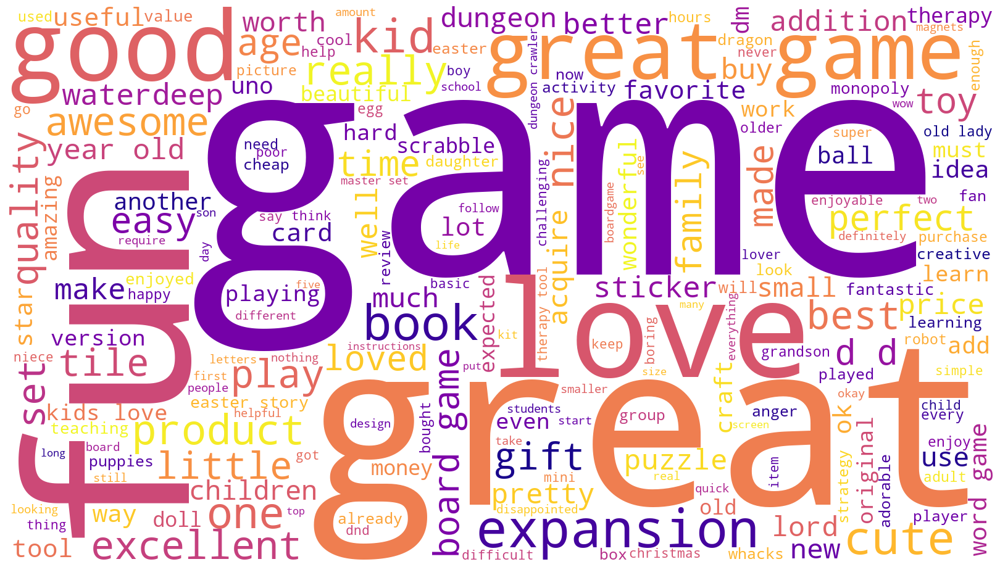

In [69]:
# Create a wordcloud without stop words.

# Create a WordCloud.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(tokens2_string) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

# Note that your word cloud might differ slightly to the one provided.

### 4d) Identify 15 most common words and polarity

In [60]:
# Determine the 15 most common words.
# View the frequency distribution.
fdist1 = FreqDist(tokens2)

# Preview the data.
fdist1

FreqDist({'game': 276, 'great': 250, 'fun': 182, 'good': 87, 'love': 79, 'like': 54, 'kids': 50, 'expansion': 44, 'book': 42, 'cute': 41, ...})

In [61]:
# Import the Counter class.
from collections import Counter

# Generate a DataFrame from Counter.
counts = pd.DataFrame(Counter(tokens2).most_common(15),
                      columns=['Word', 'Frequency']).set_index('Word')

# Preview data.
counts

,Frequency
Word,
game,276
great,250
fun,182
good,87
love,79
like,54
kids,50
expansion,44
book,42


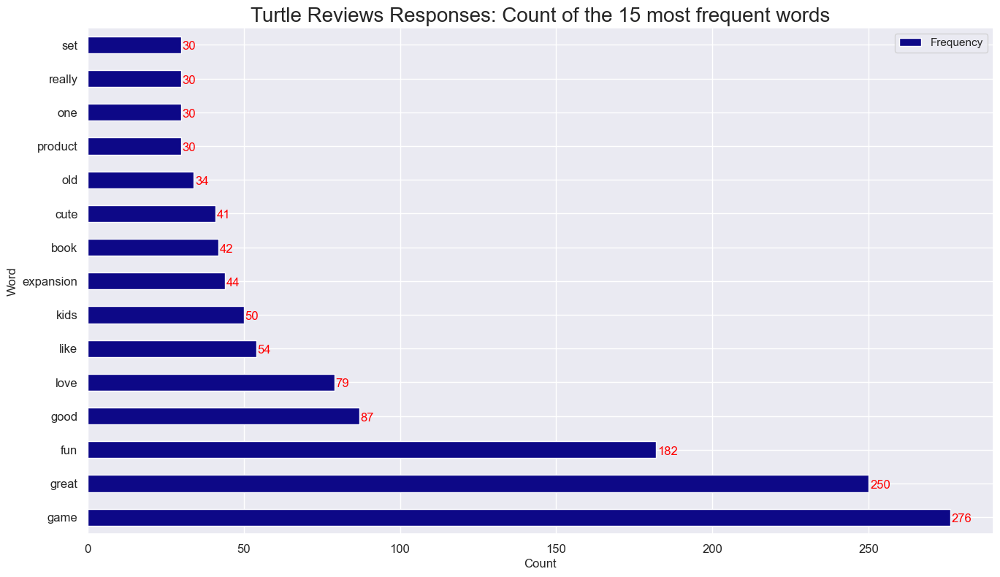

In [62]:
# Set the plot type.
ax = counts.plot(kind='barh', figsize=(16, 9), fontsize=12,
                 colormap ='plasma')

# Set the labels.
ax.set_xlabel('Count', fontsize=12)
ax.set_ylabel('Word', fontsize=12)
ax.set_title("Turtle Reviews Responses: Count of the 15 most frequent words",
             fontsize=20)

# Draw the bar labels.
for i in ax.patches:
    ax.text(i.get_width()+.41, i.get_y()+.1, str(round((i.get_width()), 2)),
            fontsize=12, color='red')

In [65]:
# Install TextBlob.
!pip install textblob

# Import the necessary package.
from textblob import TextBlob

# Example 1:
TextBlob("another worthless dungeon master's screen from").sentiment

Sentiment(polarity=-0.8, subjectivity=0.9)

In [66]:
# Example 2 from Summary:
TextBlob("another worthless dungeon master's screen from").sentiment

Sentiment(polarity=-0.8, subjectivity=0.9)

In [67]:
# Example 3 from Summary:
TextBlob("the fact that 50% of this space is wasted on a").sentiment

Sentiment(polarity=-0.2, subjectivity=0.0)

In [68]:
# Example 4 from summary:
TextBlob("pretty, but also pretty useless").sentiment

Sentiment(polarity=0.0, subjectivity=0.7333333333333334)

In [ ]:
# Example 5 from summary:
TextBlob("five stars").sentiment

In [70]:
# Example 6 from summary:
TextBlob("").sentiment

Sentiment(polarity=0.0, subjectivity=0.0)

In [72]:
# Example 7 from summary:
TextBlob("money trap").sentiment

Sentiment(polarity=0.0, subjectivity=0.0)

In [74]:
# Import the necessary package
from textblob import TextBlob

# Define a function to extract a polarity score for the summary.
def generate_polarity(summary):
    return TextBlob(summary).sentiment[0]

# Populate a new column with polarity scores for each comment.
reviews['polarity'] = reviews['summary'].apply(generate_polarity)

# Preview the result.
reviews['polarity'].head()

0    0.15
1   -0.80
2    0.00
3    0.00
4    0.00
Name: polarity, dtype: float64

In [75]:
# Define a function to extract a subjectivity score for the Summary.
def generate_subjectivity(summary):
    return TextBlob(summary).sentiment[1]

# Populate a new column with subjectivity scores for each Summary.
reviews['subjectivity'] = reviews['summary'].apply(generate_subjectivity)

# Preview the result.
reviews['subjectivity'].head()

0    0.500000
1    0.900000
2    0.733333
3    0.000000
4    0.000000
Name: subjectivity, dtype: float64

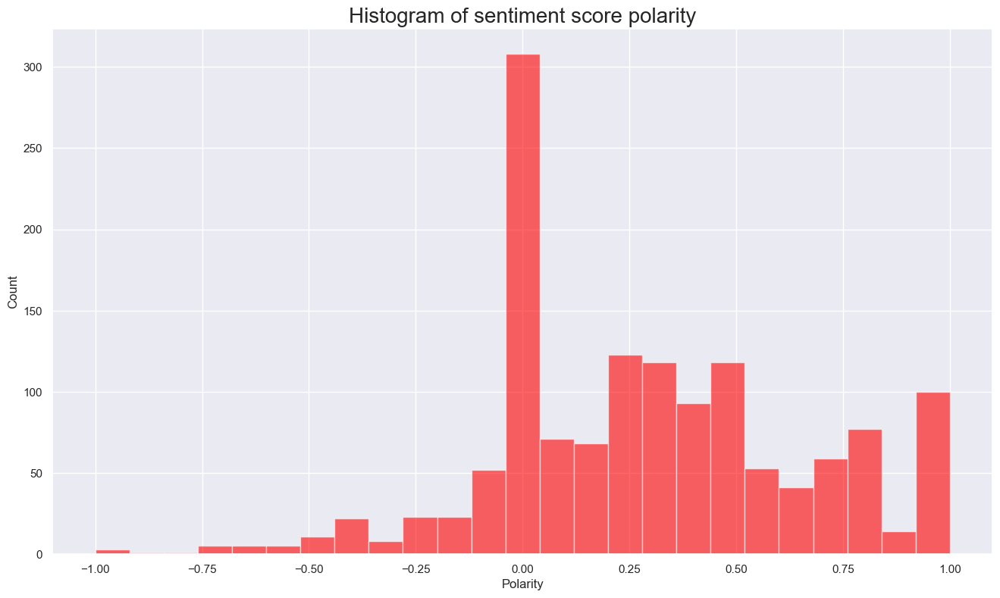

In [77]:
# Set the number of bins.
num_bins = 25

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(reviews['polarity'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score polarity', fontsize=20)

plt.show()

## 5. Review polarity and sentiment: Plot histograms of polarity (use 15 bins) and sentiment scores for the respective columns.

In [71]:
# Provided function.
def generate_polarity(comment):
    '''Extract polarity score (-1 to +1) for each comment'''
    return TextBlob(comment).sentiment[0]

In [ ]:
# Review: Create a histogram plot with bins = 15.
# Histogram of polarity


# Histogram of sentiment score


In [72]:
# Import the necessary package
from textblob import TextBlob

# Define a function to extract a polarity score for the summary.
def generate_polarity(summary):
    return TextBlob(summary).sentiment[0]

# Populate a new column with polarity scores for each comment.
reviews['polarity'] = reviews['review'].apply(generate_polarity)

# Preview the result.
reviews['polarity'].head()

0   -0.036111
1    0.035952
2    0.116640
3    0.628788
4   -0.316667
Name: polarity, dtype: float64

In [82]:
# Define a function to extract a subjectivity score for the Summary.
def generate_subjectivity(summary):
    return TextBlob(summary).sentiment[1]

# Populate a new column with subjectivity scores for each Summary.
reviews['subjectivity'] = reviews['Review'].apply(generate_subjectivity)

# Preview the result.
reviews['subjectivity'].head()

0    0.486111
1    0.442976
2    0.430435
3    0.784848
4    0.316667
Name: subjectivity, dtype: float64

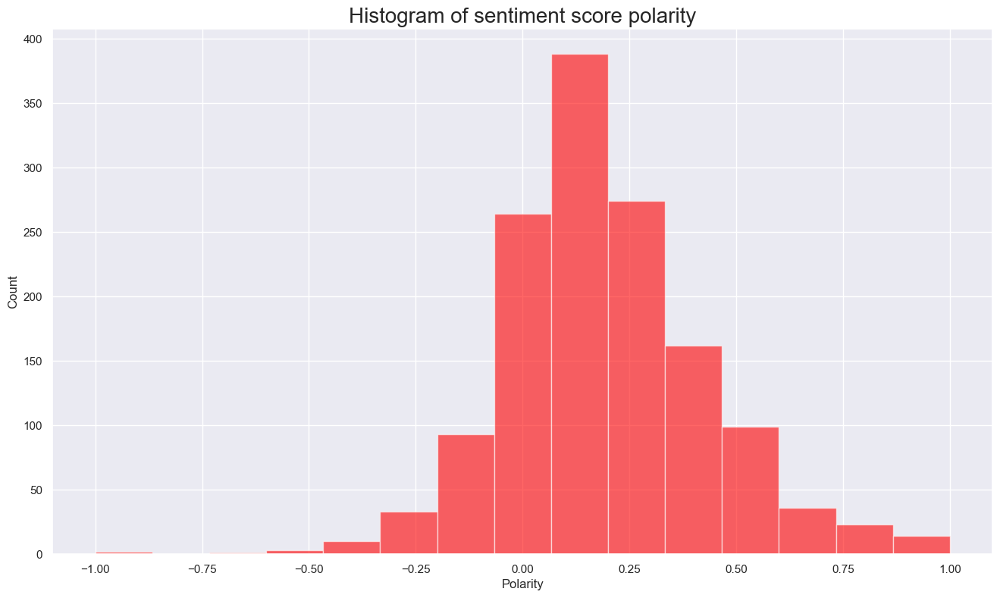

In [73]:
# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(reviews['polarity'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score polarity', fontsize=20)

plt.show()

In [ ]:
# Summary: Create a histogram plot with bins = 15.
# Histogram of polarity


# Histogram of sentiment score


In [75]:
# Import the necessary package
from textblob import TextBlob

# Define a function to extract a polarity score for the summary.
def generate_polarity(summary):
    return TextBlob(summary).sentiment[0]

# Populate a new column with polarity scores for each comment.
reviews['polarity'] = reviews['summary'].apply(generate_polarity)

# Preview the result.
reviews['polarity'].head()

0    0.15
1   -0.80
2    0.00
3    0.00
4    0.00
Name: polarity, dtype: float64

In [76]:
# Define a function to extract a subjectivity score for the Summary.
def generate_subjectivity(summary):
    return TextBlob(summary).sentiment[1]

# Populate a new column with subjectivity scores for each Summary.
reviews['subjectivity'] = reviews['summary'].apply(generate_subjectivity)

# Preview the result.
reviews['subjectivity'].head()

0    0.500000
1    0.900000
2    0.733333
3    0.000000
4    0.000000
Name: subjectivity, dtype: float64

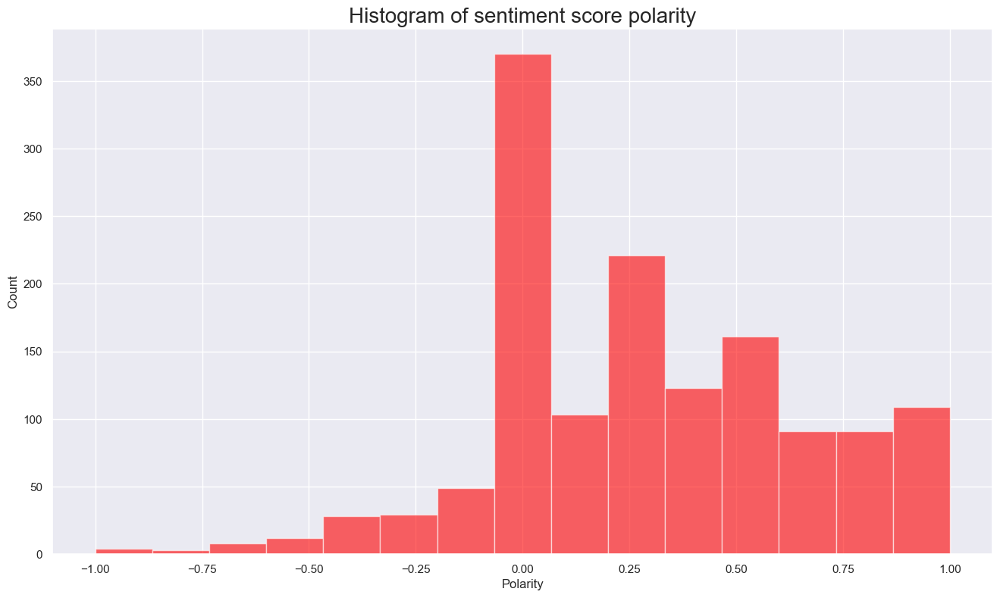

In [77]:
# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(reviews['polarity'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score polarity', fontsize=20)

plt.show()

## 6. Identify top 20 positive and negative reviews and summaries respectively

In [78]:
# Top 20 negative reviews.


# View output.
# Create a DataFrame.
positive_sentiment = reviews.nlargest(20, 'polarity')

# Eliminate unnecessary columns.
positive_sentiment = positive_sentiment[['review', 'polarity', 'subjectivity']]

# Adjust the column width.
positive_sentiment.style.set_properties(subset=['review'], **{'width': '1200px'})


,review,polarity,subjectivity
5,"i have bought many gm screens over the years, but this one is the best i have ever seen. it has all the relevant information i need , and no crap filler on it. very happy with this screen.",1.000000,0.300000
23,these are intricate designs for older children and adults. this book is full of beautiful designs just waiting to be awakened by your choice of colors. great for creativity.,1.000000,1.000000
27,awesome! my 8 year old's favorite xmas gift! it's 9:15 am xmas morning and he's already colored three of these!!,1.000000,1.000000
32,"great buy! can't wait to work on this book. the dragon images are lovely. once i'm done coloring, i will frame and hang in a window to let the sun shines through.",1.000000,0.750000
35,i absolutely love this book! its translucent paper make it super fun to use. i have been using paint brush markers and sakura gel pens on it with excellent quality. the only thing that i would recommend is a blank white sheet of paper to make the lines easier to see.,1.000000,1.000000
43,"these little books are great! they are small, but perfect for birthday party favors, which is what we used them for! there is a blank page after each page of stickers, so that's where my kids made their robots. they were a huge hit!",1.000000,0.750000
61,my daughter loves these little books. they're the perfect size to keep in the car or a diaper bag or purse. i keep them on hand for times when we're stuck waiting in a doctor's office or anywhere else.,1.000000,1.000000
95,"we bought this to give to young children that attended our wedding. kid's ranged from 4-10 years old. it would have been to have multiple robots to decorate, but the price of the book and actually the small size came in handy for us - perfect to give out to kids and fit nicely in a little treat box for them. this is great for a little gift to make a child feel special - and to keep them occupied for a bit!",1.000000,0.750000
107,"this occupied my almost-3 year old for nearly an hour. stickers were durable and easy to peel. afterwards, he kept going back to the box to see if there were more robot stickers to assemble in there. i'll probably drop another dollar and buy it again for his christmas stocking. three cheers for the short memory of a preschooler!",1.000000,1.000000
112,"i bought 8 of these for my 3 year old daughter's robot themed birthday party as favors for the little ones and it was a great hit! i didn't realize that the stickers were robot parts that the kids assemble themselves to create their own robots! that was a lot of fun and for the price, it was well worth it!",1.000000,1.000000


In [83]:
# Top 20 negative summaries.

# View output.
# Create a DataFrame.
negative_sentiment = reviews.nlargest(20, 'polarity')

# Eliminate unnecessary columns.
negative_sentiment = negative_sentiment[['review', 'polarity', 'subjectivity']]

# Adjust the column width.
negative_sentiment.style.set_properties(subset=['review'], **{'width': '1200px'})

# View output.


,review,polarity,subjectivity
5,"i have bought many gm screens over the years, but this one is the best i have ever seen. it has all the relevant information i need , and no crap filler on it. very happy with this screen.",1.000000,0.300000
23,these are intricate designs for older children and adults. this book is full of beautiful designs just waiting to be awakened by your choice of colors. great for creativity.,1.000000,1.000000
27,awesome! my 8 year old's favorite xmas gift! it's 9:15 am xmas morning and he's already colored three of these!!,1.000000,1.000000
32,"great buy! can't wait to work on this book. the dragon images are lovely. once i'm done coloring, i will frame and hang in a window to let the sun shines through.",1.000000,0.750000
35,i absolutely love this book! its translucent paper make it super fun to use. i have been using paint brush markers and sakura gel pens on it with excellent quality. the only thing that i would recommend is a blank white sheet of paper to make the lines easier to see.,1.000000,1.000000
43,"these little books are great! they are small, but perfect for birthday party favors, which is what we used them for! there is a blank page after each page of stickers, so that's where my kids made their robots. they were a huge hit!",1.000000,0.750000
61,my daughter loves these little books. they're the perfect size to keep in the car or a diaper bag or purse. i keep them on hand for times when we're stuck waiting in a doctor's office or anywhere else.,1.000000,1.000000
95,"we bought this to give to young children that attended our wedding. kid's ranged from 4-10 years old. it would have been to have multiple robots to decorate, but the price of the book and actually the small size came in handy for us - perfect to give out to kids and fit nicely in a little treat box for them. this is great for a little gift to make a child feel special - and to keep them occupied for a bit!",1.000000,0.750000
107,"this occupied my almost-3 year old for nearly an hour. stickers were durable and easy to peel. afterwards, he kept going back to the box to see if there were more robot stickers to assemble in there. i'll probably drop another dollar and buy it again for his christmas stocking. three cheers for the short memory of a preschooler!",1.000000,1.000000
112,"i bought 8 of these for my 3 year old daughter's robot themed birthday party as favors for the little ones and it was a great hit! i didn't realize that the stickers were robot parts that the kids assemble themselves to create their own robots! that was a lot of fun and for the price, it was well worth it!",1.000000,1.000000


In [85]:
# Top 20 positive reviews.

# View output.
# Create a DataFrame.
negative_sentiment = reviews.nlargest(20, 'polarity')

# Eliminate unnecessary columns.
negative_sentiment = negative_sentiment[['review', 'polarity', 'subjectivity']]

# Adjust the column width.
negative_sentiment.style.set_properties(subset=['review'], **{'width': '1200px'})


,review,polarity,subjectivity
5,"i have bought many gm screens over the years, but this one is the best i have ever seen. it has all the relevant information i need , and no crap filler on it. very happy with this screen.",1.000000,0.300000
23,these are intricate designs for older children and adults. this book is full of beautiful designs just waiting to be awakened by your choice of colors. great for creativity.,1.000000,1.000000
27,awesome! my 8 year old's favorite xmas gift! it's 9:15 am xmas morning and he's already colored three of these!!,1.000000,1.000000
32,"great buy! can't wait to work on this book. the dragon images are lovely. once i'm done coloring, i will frame and hang in a window to let the sun shines through.",1.000000,0.750000
35,i absolutely love this book! its translucent paper make it super fun to use. i have been using paint brush markers and sakura gel pens on it with excellent quality. the only thing that i would recommend is a blank white sheet of paper to make the lines easier to see.,1.000000,1.000000
43,"these little books are great! they are small, but perfect for birthday party favors, which is what we used them for! there is a blank page after each page of stickers, so that's where my kids made their robots. they were a huge hit!",1.000000,0.750000
61,my daughter loves these little books. they're the perfect size to keep in the car or a diaper bag or purse. i keep them on hand for times when we're stuck waiting in a doctor's office or anywhere else.,1.000000,1.000000
95,"we bought this to give to young children that attended our wedding. kid's ranged from 4-10 years old. it would have been to have multiple robots to decorate, but the price of the book and actually the small size came in handy for us - perfect to give out to kids and fit nicely in a little treat box for them. this is great for a little gift to make a child feel special - and to keep them occupied for a bit!",1.000000,0.750000
107,"this occupied my almost-3 year old for nearly an hour. stickers were durable and easy to peel. afterwards, he kept going back to the box to see if there were more robot stickers to assemble in there. i'll probably drop another dollar and buy it again for his christmas stocking. three cheers for the short memory of a preschooler!",1.000000,1.000000
112,"i bought 8 of these for my 3 year old daughter's robot themed birthday party as favors for the little ones and it was a great hit! i didn't realize that the stickers were robot parts that the kids assemble themselves to create their own robots! that was a lot of fun and for the price, it was well worth it!",1.000000,1.000000


In [ ]:
### positive_sentiment.at[1946, 'Review']

In [84]:
# Top 20 positive summaries.


# View output.
# Create a DataFrame.
positive_sentiment = reviews.nlargest(20, 'polarity')

# Eliminate unnecessary columns.
positive_sentiment = positive_sentiment[['summary', 'polarity', 'subjectivity']]

# Adjust the column width.
positive_sentiment.style.set_properties(subset=['summary'], **{'width': '1200px'})


,summary,polarity,subjectivity
5,best gm screen ever,1.000000,0.300000
23,wonderful designs.,1.000000,1.000000
27,perfect!,1.000000,1.000000
32,great buy! can't wait to work on this book,1.000000,0.750000
35,so beautiful!,1.000000,1.000000
43,great!,1.000000,0.750000
61,they're the perfect size to keep in the car or a diaper ...,1.000000,1.000000
95,great for a gift!,1.000000,0.750000
107,perfect for preschooler,1.000000,1.000000
112,awesome sticker activity for the price,1.000000,1.000000


In [98]:
### positive_sentiment.at[1946, 'Summary']

## 7. Discuss: Insights and observations

***Your observations here...***

In [86]:
# The word cloud demonstrates that there are a lot of positive words in summary and reviews. 
# So, even in the interpretation of what the review says, it indicates that there are more positive words like “great”, “fun”, “good”, “love”, and “like” that were in the top 6 along with the general word “game” that is the focus of the company. 
# The word cloud highlights the level of popularity for the positive words and the words that weren't as popular but where condensers like “quality” or “expansion” come off as neutral and need more context.
# A low polarity sentiment indicates that most statements have a neutral or low negative sentiment. 
# The top comments are primarily positive, such as “five stars” is a positive way forward, but most of the top comments selected were negative. 	
# When I ran the histogram for sentiment analysis, it became even more apparent that there was a high level of zero polarity, higher than negative or positive. 
# On the histogram, there was more positive sentiment up the 100 counts, particularly between .25 and .50. Looking at the top 20 negative and positive feelings of the summary and review column, most comments were positive. 
# Even when I executed the negative sentiments code, it demonstrated high neutral polarity or leaning positive.
# These reviews demonstrate many positive sentiments, which is excellent for Turtle Games. However, there are also many negatives, such as customers' comments that improvements need to be made to the products. 
# These didn’t show up on graphs like the sentiment graph enough to be a red alert.


# 